<a href="https://colab.research.google.com/github/thunderhoser/ai2es_xai_course/blob/main/lecture03_notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Lecture 3: Explanation methods for neural networks

This notebook was used for the AI2ES (NSF Institute for Research on Trustworthy Artificial Intelligence in Weather, Climate, and Coastal Oceanography) short course on XAI (explainable artificial intelligence) in May-June 2021.

If you use code from this notebook, please cite it as follows.

Lagerquist, Ryan, and David John Gagne II, 2021: "Lecture 3: Explanation methods for neural networks". AI2ES (NSF Institute for Research on Trustworthy Artificial Intelligence in Weather, Climate, and Coastal Oceanography) short course on XAI (explainable artificial intelligence), https://github.com/thunderhoser/ai2es_xai_course/.

# References

This notebook refers to a few publications, listed below.  Schwartz *et al.* (2015) documents the dataset used.

Adebayo, J., J. Gilmer, M. Muelly, I. Goodfellow, M. Hardt, and B. Kim, 2018: "Sanity checks for saliency maps." *Conference on Neural Information Processing Systems*, Montréal, Canada. Neural Information Processing Systems Foundation, http://papers.nips.cc/paper/8160-sanity-checks-for-saliency-maps.

Mamalakis, A., I. Ebert-Uphoff, and E.A. Barnes, 2021: "Neural network attribution methods for problems in geoscience: A novel synthetic benchmark dataset." *arXiv e-prints*, **2103 (10005)**, https://arxiv.org/abs/2103.10005.

Schwartz, C., G. Romine, M. Weisman, R. Sobash, K. Fossell, K. Manning, and S. Trier, 2015: "A real-time convection-allowing ensemble prediction system initialized by mesoscale ensemble Kalman filter analyses." *Weather and Forecasting*, **30 (5)**, 1158-1181, https://doi.org/10.1175/WAF-D-15-0013.1.

Selvaraju, R., M. Cogswell, A. Das, R. Vedantam, D. Parikh, and D. Batra, 2017: "Grad-CAM: Visual explanations from deep networks via gradient-based localization." *International Conference on Computer Vision*, Venice, Italy, IEEE, http://openaccess.thecvf.com/content_ICCV_2017/papers/Selvaraju_Grad-CAM_Visual_Explanations_ICCV_2017_paper.pdf.

Simonyan, K., A. Vedaldi, and A. Zisserman, 2014: "Deep inside convolutional networks: Visualising image classification models and saliency maps." *arXiv e-prints*, **1312**, https://arxiv.org/abs/1312.6034.

Zhou, B., A. Khosla, A. Lapedriza, A. Oliva, and A. Torralba, 2016: "Learning deep features for discriminative localization." *Conference on Computer Vision and Pattern Recognition*, Las Vegas, Nevada, IEEE, https://www.cv-foundation.org/openaccess/content_cvpr_2016/papers/Zhou_Learning_Deep_Features_CVPR_2016_paper.pdf.

# <font color='red'>Clone the Git repository (required)</font>

- **Please note**: when a section title is in <font color='red'>red</font>, that means the code cell below is required.
- In other words, if you don't run the code cell below, subsequent code cells might not work.

In [ ]:
import os
import shutil

if os.path.isdir('course_repository'):
    shutil.rmtree('course_repository')

!git clone https://github.com/thunderhoser/ai2es_xai_course course_repository
!cd course_repository; python setup.py install

Cloning into 'course_repository'...
remote: Enumerating objects: 151, done.
remote: Counting objects: 100% (151/151), done.
remote: Compressing objects: 100% (109/109), done.
remote: Total 151 (delta 86), reused 102 (delta 41), pack-reused 0
Receiving objects: 100% (151/151), 62.95 MiB | 40.92 MiB/s, done.
Resolving deltas: 100% (86/86), done.
running install
running bdist_egg
running egg_info
creating ai2es_xai_course.egg-info
writing ai2es_xai_course.egg-info/PKG-INFO
writing dependency_links to ai2es_xai_course.egg-info/dependency_links.txt
writing requirements to ai2es_xai_course.egg-info/requires.txt
writing top-level names to ai2es_xai_course.egg-info/top_level.txt
writing manifest file 'ai2es_xai_course.egg-info/SOURCES.txt'
adding license file 'LICENSE'
writing manifest file 'ai2es_xai_course.egg-info/SOURCES.txt'
installing library code to build/bdist.linux-x86_64/egg
running install_lib
running build_py
creating build
creating build/lib
creating build/lib/ai2es_xai_course
cop

# <font color='red'>Import packages (required)</font>

The next two cells import all packages used in the notebook.

In [ ]:
import sys

sys.path.append('/content/data/')
sys.path.append('/content/course_repository/')
sys.path.append('/content/course_repository/ai2es_xai_course/')
sys.path.append('/content/course_repository/ai2es_xai_course/utils/')

In [ ]:
%matplotlib inline
import copy
import random
import os.path
import warnings
import numpy
import keras
import tensorflow
from matplotlib import pyplot
from ai2es_xai_course.plotting import image_plotting, feature_map_plotting
from ai2es_xai_course.utils import utils, image_utils, image_normalization, \
    image_thresholding, cnn, saliency, class_activation, occlusion

warnings.filterwarnings('ignore')
tensorflow.compat.v1.disable_eager_execution()
tensorflow.compat.v1.experimental.output_all_intermediates(True)

SEPARATOR_STRING = '\n\n' + '*' * 50 + '\n\n'
MINOR_SEPARATOR_STRING = '\n\n' + '-' * 50 + '\n\n'

TABULAR_DATA_DIR_NAME = '/content/data/track_data_ncar_ams_3km_csv_small'
IMAGE_DATA_DIR_NAME = '/content/data/track_data_ncar_ams_3km_nc_small'

BEST_HIT_MATRIX_KEY = 'best_hits_predictor_matrix'
WORST_FALSE_ALARM_MATRIX_KEY = 'worst_false_alarms_predictor_matrix'
WORST_MISS_MATRIX_KEY = 'worst_misses_predictor_matrix'
BEST_CORRECT_NULLS_MATRIX_KEY = 'best_correct_nulls_predictor_matrix'
PREDICTOR_NAMES_KEY = 'predictor_names'

# <font color='red'>Prevent auto-scrolling (required)</font>

In [ ]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

# <font color='red'>Download input data (required)</font>

The next cell downloads all input data used in this notebook.

In [ ]:
!python /content/course_repository/download_tabular_data.py
!python /content/course_repository/download_image_data.py

Unzipping file: "data/track_data_ncar_ams_3km_csv_small.tar.gz"...
Unzipping file: "data/track_data_ncar_ams_3km_nc_small.tar.gz"...


# <font color='red'>Read tabular data for FCNNs (required)</font>

The next cell reads tabular data (for fully connected neural networks [FCNN]) into memory.

In [ ]:
tabular_training_file_names = utils.find_tabular_files(
    directory_name=TABULAR_DATA_DIR_NAME, first_date_string='20100101',
    last_date_string='20141231'
)
tabular_validation_file_names = utils.find_tabular_files(
    directory_name=TABULAR_DATA_DIR_NAME, first_date_string='20150101',
    last_date_string='20151231'
)
tabular_testing_file_names = utils.find_tabular_files(
    directory_name=TABULAR_DATA_DIR_NAME, first_date_string='20160101',
    last_date_string='20171231'
)

(tabular_training_metadata_table, tabular_training_predictor_table_denorm,
 tabular_training_target_table
) = utils.read_many_tabular_files(tabular_training_file_names)
print(MINOR_SEPARATOR_STRING)

(tabular_validation_metadata_table, tabular_validation_predictor_table_denorm,
 tabular_validation_target_table
) = utils.read_many_tabular_files(tabular_validation_file_names)
print(MINOR_SEPARATOR_STRING)

(tabular_testing_metadata_table, tabular_testing_predictor_table_denorm,
 tabular_testing_target_table
) = utils.read_many_tabular_files(tabular_testing_file_names)
print(MINOR_SEPARATOR_STRING)

print('Variables in metadata are as follows:\n{0:s}'.format(
    str(list(tabular_training_metadata_table))
))

print('\nPredictor variables are as follows:\n{0:s}'.format(
    str(list(tabular_training_predictor_table_denorm))
))

print('\nTarget variable is as follows:\n{0:s}'.format(
    str(list(tabular_training_target_table))
))

first_predictor_name = list(tabular_training_predictor_table_denorm)[0]
these_predictor_values = (
    tabular_training_predictor_table_denorm[first_predictor_name].values[:10]
)

message_string = (
    '\nValues of predictor variable "{0:s}" for the first training '
    'examples:\n{1:s}'
).format(first_predictor_name, str(these_predictor_values))
print(message_string)

target_name = list(tabular_training_target_table)[0]
these_target_values = tabular_training_target_table[target_name].values[:10]

message_string = (
    '\nValues of target variable for the first training examples:\n{0:s}'
).format(str(these_target_values))
print(message_string)

Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20101024-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20101122-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20110201-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20110308-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20110326-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20110404-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20110414-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20110420-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_N

# <font color='red'>Read image data for CNNs (required)</font>

The next cell reads image data (for convolutional neural networks [CNN]) into memory.

In [ ]:
image_training_file_names = image_utils.find_many_files(
    first_date_string='20100101', last_date_string='20141224',
    directory_name=IMAGE_DATA_DIR_NAME
)

image_validation_file_names = image_utils.find_many_files(
    first_date_string='20150101', last_date_string='20151231',
    directory_name=IMAGE_DATA_DIR_NAME
)

image_testing_file_names = image_utils.find_many_files(
    first_date_string='20160101', last_date_string='20171231',
    directory_name=IMAGE_DATA_DIR_NAME
)

training_image_dict = image_utils.read_many_files(image_training_file_names)
print('\n')

validation_image_dict = image_utils.read_many_files(image_validation_file_names)
print('\n')

testing_image_dict = image_utils.read_many_files(image_testing_file_names)

Reading data from: "/content/data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20101024-0000_d01_model_patches.nc"...
Reading data from: "/content/data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20101122-0000_d01_model_patches.nc"...
Reading data from: "/content/data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110201-0000_d01_model_patches.nc"...
Reading data from: "/content/data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110308-0000_d01_model_patches.nc"...
Reading data from: "/content/data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110326-0000_d01_model_patches.nc"...
Reading data from: "/content/data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110404-0000_d01_model_patches.nc"...
Reading data from: "/content/data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110414-0000_d01_model_patches.nc"...
Reading data from: "/content/data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110420-0000_d01_model_patches.nc"...
Reading data from: "/content/data/track_data_ncar_ams_3km_nc_small/NCARS

# <font color='red'>Normalize tabular data (required)</font>

The next cell does the following:

 - Finds normalization parameters (mean and standard deviation) for each predictor, based only on the training data.
 - Normalizes the training, validation, and testing data.
 - Denormalizes the training data and ensures that denormalized values = original values (sanity check).

In [ ]:
predictor_names = list(tabular_training_predictor_table_denorm)
these_predictor_values = (
    tabular_training_predictor_table_denorm[predictor_names[0]].values[:10]
)

message_string = (
    'Original values of "{0:s}" for the first training examples:\n{1:s}'
).format(predictor_names[0], str(these_predictor_values))
print(message_string)

tabular_training_predictor_table, tabular_normalization_dict = (
    utils.normalize_predictors(
        predictor_table=copy.deepcopy(tabular_training_predictor_table_denorm)
    )
)

these_predictor_values = (
    tabular_training_predictor_table[predictor_names[0]].values[:10]
)

message_string = (
    '\nNormalized values of "{0:s}" for the first training examples:\n{1:s}'
).format(predictor_names[0], str(these_predictor_values))
print(message_string)

tabular_training_predictor_table_denorm = utils.denormalize_predictors(
    predictor_table=copy.deepcopy(tabular_training_predictor_table),
    normalization_dict=tabular_normalization_dict
)

these_predictor_values = (
    tabular_training_predictor_table_denorm[predictor_names[0]].values[:10]
)

message_string = (
    '\n*De*normalized values (should equal original values) of "{0:s}" for '
    'the first training examples:\n{1:s}'
).format(predictor_names[0], str(these_predictor_values))
print(message_string)

tabular_validation_predictor_table, _ = utils.normalize_predictors(
    predictor_table=copy.deepcopy(tabular_validation_predictor_table_denorm),
    normalization_dict=tabular_normalization_dict
)

tabular_testing_predictor_table, _ = utils.normalize_predictors(
    predictor_table=copy.deepcopy(tabular_testing_predictor_table_denorm),
    normalization_dict=tabular_normalization_dict
)

Original values of "composite_refl_mean_dbz" for the first training examples:
[42.71822 47.09285 45.53852 44.30976 44.64383 44.33831 45.73259 43.69113
 45.3804  47.31104]

Normalized values of "composite_refl_mean_dbz" for the first training examples:
[-1.03619508  0.06182963 -0.32830456 -0.63672124 -0.55287024 -0.62955524
 -0.27959332 -0.79199632 -0.36799241  0.11659495]

*De*normalized values (should equal original values) of "composite_refl_mean_dbz" for the first training examples:
[42.71822 47.09285 45.53852 44.30976 44.64383 44.33831 45.73259 43.69113
 45.3804  47.31104]


# <font color='red'>Find normalization params for image data (required)</font>

The next cell does the following:

 - Finds normalization parameters (mean and standard deviation) for each channel, based only on the training data.
 - But does not actually normalize any data (this will be done on the fly, as needed).  Keeping a normalized and unnormalized version of each dataset (training, validation, and testing) would take up too much memory.

In [ ]:
image_normalization_dict = image_normalization.get_normalization_params(
    image_dict=training_image_dict
)

# <font color='red'>Binarize target variable for tabular data (required)</font>

The next cell binarizes the target variable (max future vorticity in s$^{-1}$) in tabular data.

- **Binarization turns each value into a 0 (no) or 1 (yes), based on whether or not future vorticity reaches a threshold.**
- Necessary because neural nets in this notebook do classification, not regression.
- However, both types of neural nets (FCNN and CNN) can also do regression.

In [ ]:
tabular_binarization_threshold = utils.get_binarization_threshold(
    tabular_file_names=tabular_training_file_names, percentile_level=90.
)
print(MINOR_SEPARATOR_STRING)

these_target_values = (
    tabular_training_target_table[utils.TARGET_NAME].values[1030:1050]
)

message_string = (
    'Real-numbered target values for a few training examples:\n{0:s}'
).format(str(these_target_values))
print(message_string)

training_target_values = utils.binarize_target_values(
    target_values=tabular_training_target_table[utils.TARGET_NAME].values,
    binarization_threshold=tabular_binarization_threshold
)
tabular_training_target_table = tabular_training_target_table.assign(
    **{utils.BINARIZED_TARGET_NAME: training_target_values}
)

print('\nBinarization threshold = {0:.3e} s^-1'.format(
    tabular_binarization_threshold
))

these_target_values = (
    tabular_training_target_table[utils.BINARIZED_TARGET_NAME].values[1030:1050]
)

message_string = (
    '\nBinarized target values for the same training examples:\n{0:s}'
).format(str(these_target_values))
print(message_string)

validation_target_values = utils.binarize_target_values(
    target_values=tabular_validation_target_table[utils.TARGET_NAME].values,
    binarization_threshold=tabular_binarization_threshold
)
tabular_validation_target_table = tabular_validation_target_table.assign(
    **{utils.BINARIZED_TARGET_NAME: validation_target_values}
)

testing_target_values = utils.binarize_target_values(
    target_values=tabular_testing_target_table[utils.TARGET_NAME].values,
    binarization_threshold=tabular_binarization_threshold
)
tabular_testing_target_table = tabular_testing_target_table.assign(
    **{utils.BINARIZED_TARGET_NAME: testing_target_values}
)

Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20101024-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20101122-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20110201-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20110308-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20110326-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20110404-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20110414-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20110420-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_N

# <font color='red'>Find binarization threshold for image data (required)</font>

The next cell does the following:

 - Finds the binarization threshold (on max future vorticity in s$^{-1}$) for image data.
 - Does not actually binarize image data (this will be done on the fly, as needed).

In [ ]:
image_binarization_threshold = image_thresholding.get_binarization_threshold(
    image_dict=training_image_dict, percentile_level=90.
)


Binarization threshold for "max_future_vorticity_s01" = 5.4310e-03


# <font color='red'>Read pre-trained FCNN (required)</font>

The next cell reads a pre-trained FCNN, which will be used to create saliency maps and input-times-gradient maps.

In [ ]:
fcnn_file_name = (
    '/content/course_repository/dense_net_for_interpretation/model.h5'
)

fcnn_model_object = utils.read_dense_net(fcnn_file_name)
fcnn_model_object.summary()

Instructions for updating:
Colocations handled automatically by placer.
Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 41)]              0         
_________________________________________________________________
dense (Dense)                (None, 1000)              42000     
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 1000)              0         
_________________________________________________________________
dropout (Dropout)            (None, 1000)              0         
_________________________________________________________________
batch_normalization (BatchNo (None, 1000)              4000      
_________________________________________________________________
dense_1 (Dense)              (None, 178)               178178    
________________________________________________

# <font color='red'>Read pre-trained CNN (required)</font>

The next cell reads a pre-trained CNN, which will be used for all explanation methods in this notebook.

In [ ]:
cnn_file_name = '/content/course_repository/pretrained_cnn/model.h5'
cnn_model_object = utils.read_dense_net(cnn_file_name)
cnn_model_object.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 32, 32, 4)]       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 32, 32, 32)        1184      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 32, 32, 32)        0         
_________________________________________________________________
batch_normalization (BatchNo (None, 32, 32, 32)        128       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 32, 32, 32)        9248      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 32, 32, 32)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 32, 32, 32)       

# Extreme cases for pre-trained CNN

There are four types of extreme cases, defined below.  A positive (negative) example is a storm that does (not) develop strong rotation in the future.

 - **Best hits**: the 100 positive examples with highest forecast probability
 - **Worst false alarms**: the 100 negative examples with highest forecast probability
 - **Worst misses**: the 100 positive examples with lowest forecast probability
 - **Best correct nulls**: the 100 negative examples with lowest forecast probability

## <font color='red'>Find extreme cases (required)</font>

The next cell finds extreme cases for the pre-trained CNN.

In [ ]:
predictor_names = testing_image_dict[image_utils.PREDICTOR_NAMES_KEY]

testing_predictor_matrix_denorm = (
    testing_image_dict[image_utils.PREDICTOR_MATRIX_KEY]
)

testing_predictor_matrix_norm, _ = image_normalization.normalize_data(
    predictor_matrix=copy.deepcopy(testing_predictor_matrix_denorm),
    predictor_names=predictor_names, normalization_dict=image_normalization_dict
)

testing_classes = image_thresholding.binarize_target_images(
    target_matrix=testing_image_dict[image_utils.TARGET_MATRIX_KEY],
    binarization_threshold=image_binarization_threshold
)

testing_probs = cnn.apply_model(
    model_object=cnn_model_object,
    predictor_matrix=testing_predictor_matrix_norm
)

this_dict = utils.find_extreme_examples(
    observed_labels=testing_classes, forecast_probabilities=testing_probs,
    num_examples_per_set=100
)
best_hit_indices = this_dict[utils.HIT_INDICES_KEY]
worst_false_alarm_indices = this_dict[utils.FALSE_ALARM_INDICES_KEY]
worst_miss_indices = this_dict[utils.MISS_INDICES_KEY]
best_correct_null_indices = this_dict[utils.CORRECT_NULL_INDICES_KEY]

extreme_example_dict_denorm = {
    BEST_HIT_MATRIX_KEY:
        testing_predictor_matrix_denorm[best_hit_indices, ...],
    WORST_FALSE_ALARM_MATRIX_KEY:
        testing_predictor_matrix_denorm[worst_false_alarm_indices, ...],
    WORST_MISS_MATRIX_KEY:
        testing_predictor_matrix_denorm[worst_miss_indices, ...],
    BEST_CORRECT_NULLS_MATRIX_KEY:
        testing_predictor_matrix_denorm[best_correct_null_indices, ...],
    PREDICTOR_NAMES_KEY: predictor_names
}

extreme_example_dict_norm = {
    BEST_HIT_MATRIX_KEY:
        testing_predictor_matrix_norm[best_hit_indices, ...],
    WORST_FALSE_ALARM_MATRIX_KEY:
        testing_predictor_matrix_norm[worst_false_alarm_indices, ...],
    WORST_MISS_MATRIX_KEY:
        testing_predictor_matrix_norm[worst_miss_indices, ...],
    BEST_CORRECT_NULLS_MATRIX_KEY:
        testing_predictor_matrix_norm[best_correct_null_indices, ...],
    PREDICTOR_NAMES_KEY: predictor_names
}

this_bh_matrix = utils.run_pmm_many_variables(
    field_matrix=extreme_example_dict_denorm[BEST_HIT_MATRIX_KEY]
)
this_wfa_matrix = utils.run_pmm_many_variables(
    field_matrix=extreme_example_dict_denorm[WORST_FALSE_ALARM_MATRIX_KEY]
)
this_wm_matrix = utils.run_pmm_many_variables(
    field_matrix=extreme_example_dict_denorm[WORST_MISS_MATRIX_KEY]
)
this_bcn_matrix = utils.run_pmm_many_variables(
    field_matrix=extreme_example_dict_denorm[BEST_CORRECT_NULLS_MATRIX_KEY]
)

extreme_example_dict_denorm_pmm = {
    BEST_HIT_MATRIX_KEY: this_bh_matrix,
    WORST_FALSE_ALARM_MATRIX_KEY: this_wfa_matrix,
    WORST_MISS_MATRIX_KEY: this_wm_matrix,
    BEST_CORRECT_NULLS_MATRIX_KEY: this_bcn_matrix,
    PREDICTOR_NAMES_KEY: predictor_names
}

Applying model to examples 0-999 of 19368...
Applying model to examples 1000-1999 of 19368...
Applying model to examples 2000-2999 of 19368...
Applying model to examples 3000-3999 of 19368...
Applying model to examples 4000-4999 of 19368...
Applying model to examples 5000-5999 of 19368...
Applying model to examples 6000-6999 of 19368...
Applying model to examples 7000-7999 of 19368...
Applying model to examples 8000-8999 of 19368...
Applying model to examples 9000-9999 of 19368...
Applying model to examples 10000-10999 of 19368...
Applying model to examples 11000-11999 of 19368...
Applying model to examples 12000-12999 of 19368...
Applying model to examples 13000-13999 of 19368...
Applying model to examples 14000-14999 of 19368...
Applying model to examples 15000-15999 of 19368...
Applying model to examples 16000-16999 of 19368...
Applying model to examples 17000-17999 of 19368...
Applying model to examples 18000-18999 of 19368...
Applying model to examples 19000-19367 of 19368...
Have

## Plot extreme cases

 - The next cell plots a composite (average storm) for each set of extreme cases.
 - Specifically, we plot the PMM (probability-matched means; Ebert 2001) composite.
 - PMM is similar to taking the arithmetic mean at each grid cell, but it preserves spatial structure better.

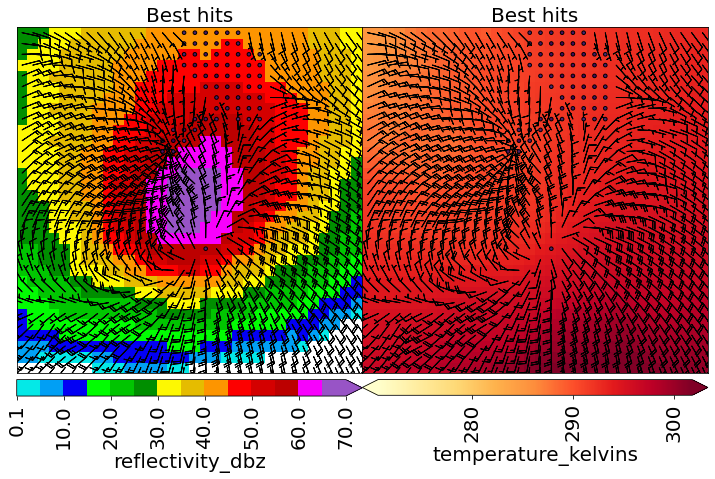

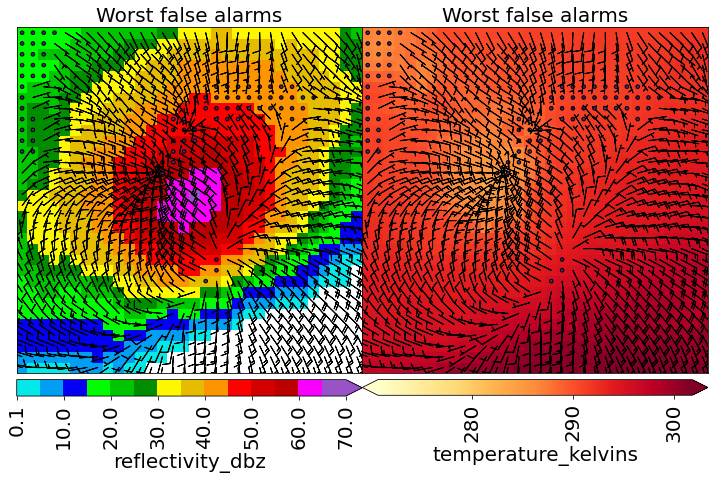

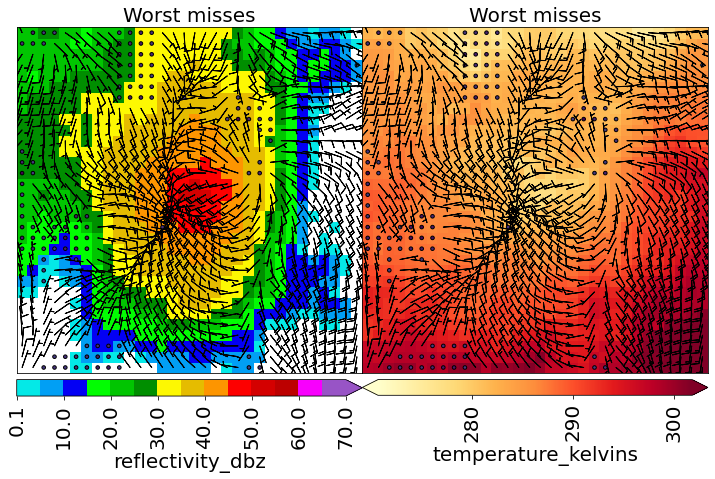

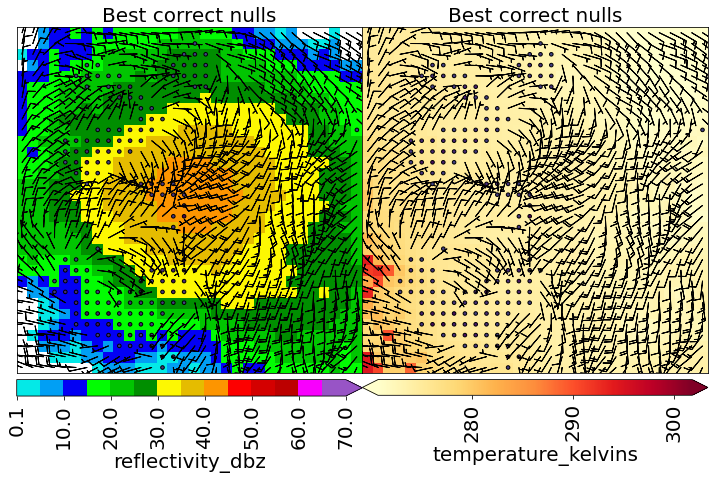

In [ ]:
best_hits_matrix_denorm_pmm = extreme_example_dict_denorm_pmm[
    BEST_HIT_MATRIX_KEY
]
worst_fa_matrix_denorm_pmm = extreme_example_dict_denorm_pmm[
    WORST_FALSE_ALARM_MATRIX_KEY
]
worst_misses_matrix_denorm_pmm = extreme_example_dict_denorm_pmm[
    WORST_MISS_MATRIX_KEY
]
best_nulls_matrix_denorm_pmm = extreme_example_dict_denorm_pmm[
    BEST_CORRECT_NULLS_MATRIX_KEY
]
predictor_names = extreme_example_dict_denorm_pmm[PREDICTOR_NAMES_KEY]

concat_predictor_matrix = numpy.stack((
    best_hits_matrix_denorm_pmm, worst_fa_matrix_denorm_pmm,
    worst_misses_matrix_denorm_pmm, best_nulls_matrix_denorm_pmm,
), axis=0)

temperature_matrix_kelvins = concat_predictor_matrix[
    ..., predictor_names.index(image_utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_with_barbs(
        predictor_matrix=best_hits_matrix_denorm_pmm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins)
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        axes_object_matrix[i, j].set_title('Best hits')

pyplot.show()
print('\n\n')

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_with_barbs(
        predictor_matrix=worst_fa_matrix_denorm_pmm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins)
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        axes_object_matrix[i, j].set_title('Worst false alarms')

pyplot.show()
print('\n\n')

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_with_barbs(
        predictor_matrix=worst_misses_matrix_denorm_pmm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins)
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        axes_object_matrix[i, j].set_title('Worst misses')

pyplot.show()
print('\n\n')

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_with_barbs(
        predictor_matrix=best_nulls_matrix_denorm_pmm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins)
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        axes_object_matrix[i, j].set_title('Best correct nulls')

# Feature visualization

## Theory

 - **Visualizing feature maps is one of the easiest ways to query a CNN.**
 - You can also do this for FCNNs, but less useful because feature "maps" (vectors) are not spatial.
 - For a convolutional layer with $C$ filters, there are $C$ feature maps for each data example.
<br><br>
**Feature maps can tell you the following:**
 - Which predictors is the CNN most sensitive to?
   - *e.g.,* Do a bunch of the feature maps have patterns similar to reflectivity?
 - Does the conv layer have too many filters (a lot of redundant feature maps)?
 - Does the conv layer have too few filters (feature maps all wildly different)?
<br><br>
**The last two questions are related to the expressive power of the CNN.**
 - Too much expressive power = overfitting
 - Too little expressive power = underfitting
<br><br>
 - However, feature visualization is only a rudimentary XAI method.
 - Feature visualization may be the first XAI method you use, but it should not be the last.

## Random example

The next cell plots feature maps for a random example from the testing set.

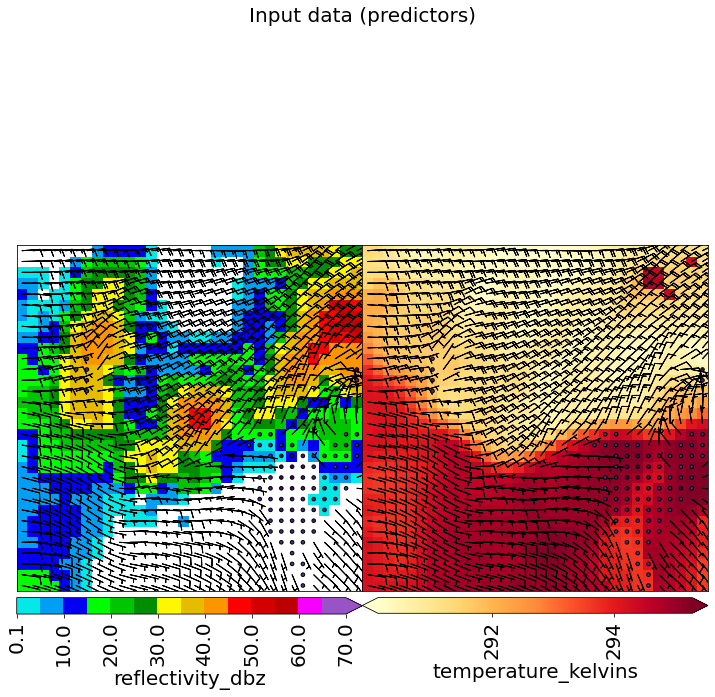

FailedPreconditionError: ignored

In [ ]:
layer_names = [
    'batch_normalization', 'batch_normalization_1', 'batch_normalization_2',
    'batch_normalization_3', 'batch_normalization_4', 'batch_normalization_5',
    'batch_normalization_6', 'batch_normalization_7'
]

predictor_matrix_denorm = testing_image_dict[image_utils.PREDICTOR_MATRIX_KEY]
predictor_names = testing_image_dict[image_utils.PREDICTOR_NAMES_KEY]

num_examples = predictor_matrix_denorm.shape[0]
random_index = random.randint(0, num_examples - 1)
# random_index = 14138
predictor_matrix_denorm = predictor_matrix_denorm[random_index, ...]

temperature_matrix_kelvins = predictor_matrix_denorm[
    ..., predictor_names.index(image_utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

figure_object, _ = image_plotting.plot_many_predictors_with_barbs(
    predictor_matrix=predictor_matrix_denorm, predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

figure_object.suptitle('Input data (predictors)')
pyplot.show()

predictor_matrix_norm, _ = image_normalization.normalize_data(
    predictor_matrix=copy.deepcopy(predictor_matrix_denorm),
    predictor_names=predictor_names, normalization_dict=image_normalization_dict
)

for k in range(len(layer_names)):
    feature_matrix = cnn.apply_model(
        model_object=cnn_model_object,
        predictor_matrix=numpy.expand_dims(predictor_matrix_norm, axis=0),
        verbose=False, output_layer_name=layer_names[k]
    )[0, ...]

    max_colour_value = numpy.percentile(numpy.absolute(feature_matrix), 99)

    num_channels = feature_matrix.shape[-1]
    num_panel_rows = int(numpy.floor(
        numpy.sqrt(num_channels)
    ))

    figure_object, _ = feature_map_plotting.plot_many_2d_feature_maps(
        feature_matrix=feature_matrix,
        annotation_string_by_panel=[''] * num_channels,
        num_panel_rows=num_panel_rows,
        colour_map_object=pyplot.get_cmap('seismic'),
        min_colour_value=-1 * max_colour_value,
        max_colour_value=max_colour_value,
        figure_width_inches=7.5, figure_height_inches=7.5
    )

    figure_object.suptitle('Feature maps for {0:d}th conv layer'.format(k + 1))

## Strong example

The next cell plots feature maps for the strongest example in the testing data (that with the greatest max future vorticity).

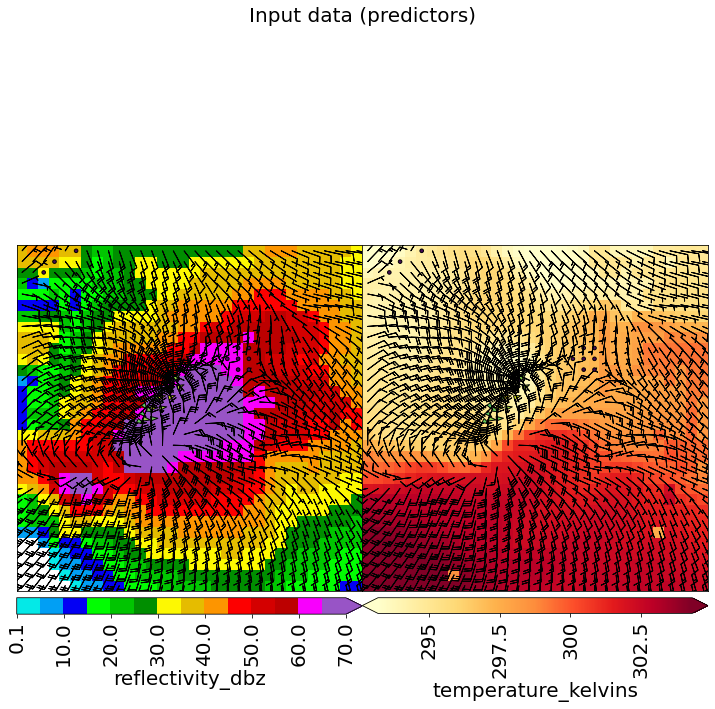

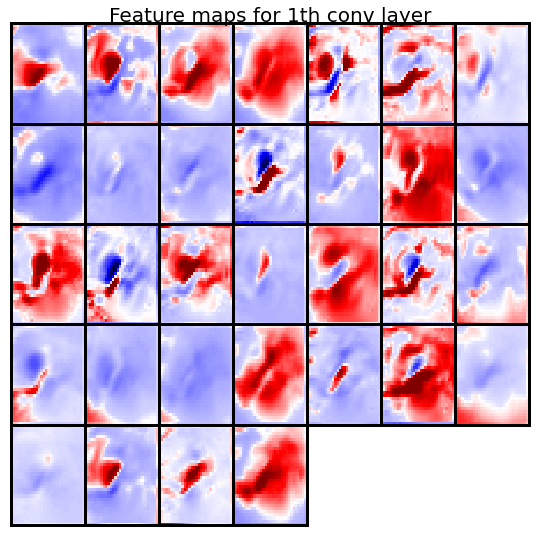

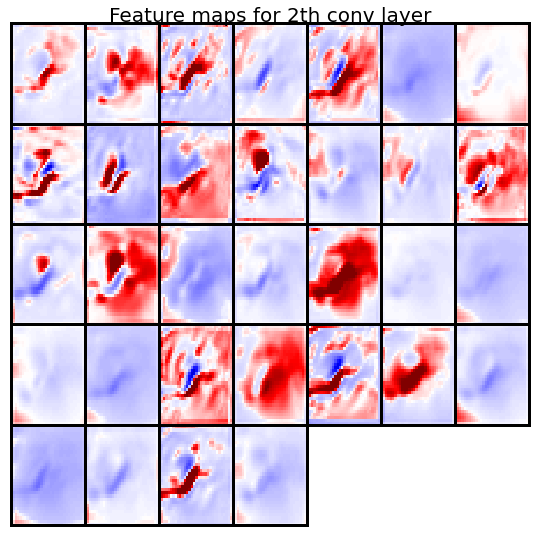

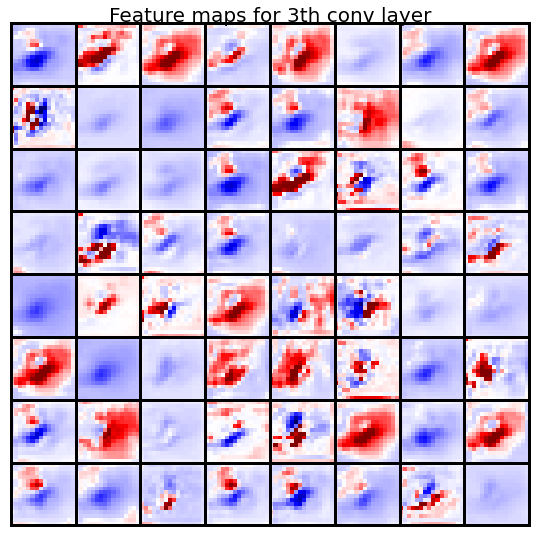

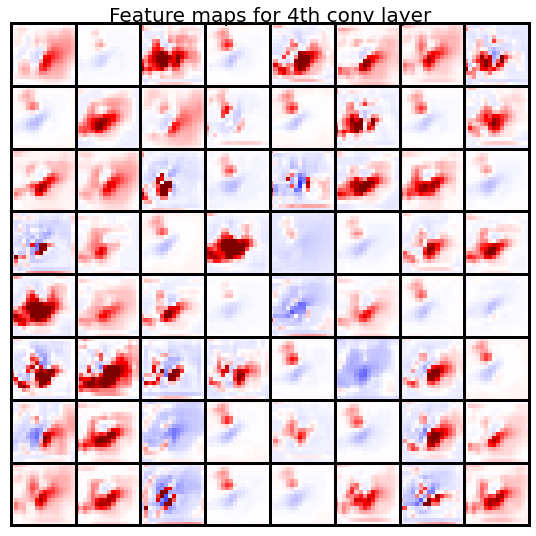

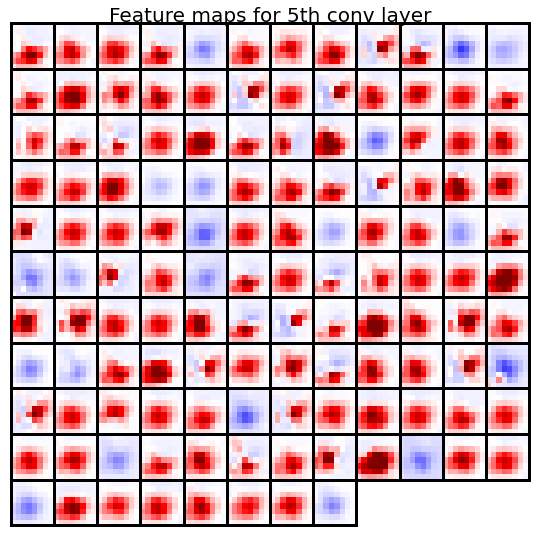

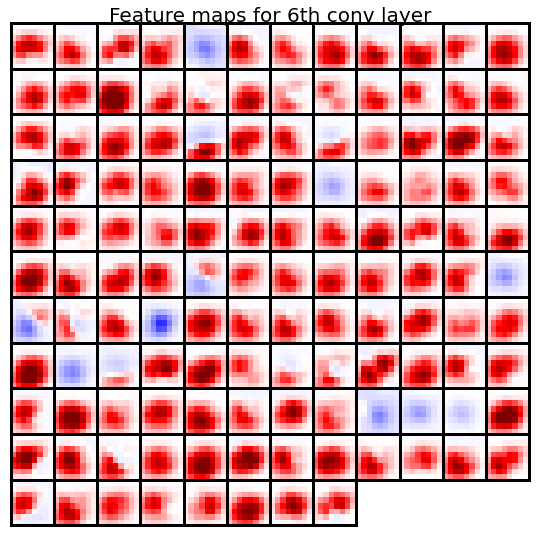

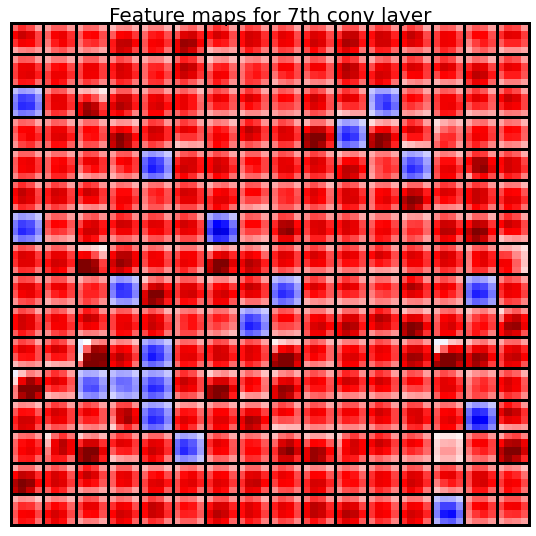

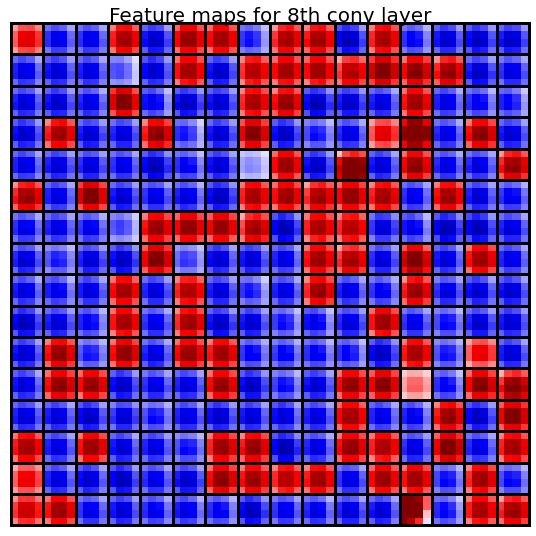

In [ ]:
layer_names = [
    'batch_normalization', 'batch_normalization_1', 'batch_normalization_2',
    'batch_normalization_3', 'batch_normalization_4', 'batch_normalization_5',
    'batch_normalization_6', 'batch_normalization_7'
]

predictor_matrix_denorm = testing_image_dict[image_utils.PREDICTOR_MATRIX_KEY]
predictor_names = testing_image_dict[image_utils.PREDICTOR_NAMES_KEY]

target_matrix_s01 = testing_image_dict[image_utils.TARGET_MATRIX_KEY]
example_index = numpy.unravel_index(
    numpy.argmax(target_matrix_s01), target_matrix_s01.shape
)[0]
predictor_matrix_denorm = predictor_matrix_denorm[example_index, ...]

temperature_matrix_kelvins = predictor_matrix_denorm[
    ..., predictor_names.index(image_utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

figure_object, _ = image_plotting.plot_many_predictors_with_barbs(
    predictor_matrix=predictor_matrix_denorm, predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

figure_object.suptitle('Input data (predictors)')
pyplot.show()

predictor_matrix_norm, _ = image_normalization.normalize_data(
    predictor_matrix=copy.deepcopy(predictor_matrix_denorm),
    predictor_names=predictor_names, normalization_dict=image_normalization_dict
)

for k in range(len(layer_names)):
    feature_matrix = cnn.apply_model(
        model_object=cnn_model_object,
        predictor_matrix=numpy.expand_dims(predictor_matrix_norm, axis=0),
        verbose=False, output_layer_name=layer_names[k]
    )[0, ...]

    max_colour_value = numpy.percentile(numpy.absolute(feature_matrix), 99)

    num_channels = feature_matrix.shape[-1]
    num_panel_rows = int(numpy.floor(
        numpy.sqrt(num_channels)
    ))

    figure_object, _ = feature_map_plotting.plot_many_2d_feature_maps(
        feature_matrix=feature_matrix,
        annotation_string_by_panel=[''] * num_channels,
        num_panel_rows=num_panel_rows,
        colour_map_object=pyplot.get_cmap('seismic'),
        min_colour_value=-1 * max_colour_value,
        max_colour_value=max_colour_value,
        figure_width_inches=7.5, figure_height_inches=7.5
    )

    figure_object.suptitle('Feature maps for {0:d}th conv layer'.format(k + 1))

# Saliency maps for FCNNs

## Theory

 - Importance-ranking methods are great for telling you which predictors are most important on average.
 - Partial-dependence plots (PDP) are great for telling you how a predictor affects the model prediction, on average.
<br><br>

**What these methods do not tell you:**
 - Which predictors are most important for a specific example?
 - How does a predictor affect the model prediction for a specific example?
<br><br>

**Saliency (Simonyan *et al.* 2014), defined below, addresses these problems:**
<br><br>
<center>$s = \frac{\partial a}{\partial x} \bigg \rvert_{x = x_0}$</center>
<br>

 - $a$ = activation of one neuron (typically an output neuron)
 - $x$ = one predictor variable
 - $x_0$ = $x$-value in a real example
<br><br>

In plain English: saliency is a linear approx to $\frac{\partial a}{\partial x}$, valid around the $x$-value found in a real example.
<br><br>

**Saliency can be used for any model that does gradient descent:**
 - Linear and logistic regression
 - Neural networks (fully connected, convolutional, etc.)
 - But not trees or forests
<br><br>

 - In the Colab notebook, there is only one output neuron and its activation is $p$ (probability of strong future rotation).
 - Thus, our saliency maps quantify the sensitivity of $p$ to each predictor.
 - **In other words, our saliency maps answer the following question (from the neural network’s perspective):**

<center>"How would you change the storm to increase/decrease the probability of strong future rotation?"</center>
<br><br>

**Advantages of saliency maps:**
 - Provide example-specific explanations
 - Provide spatially and spectrally rich info (one value per pixel per channel)
 - For spatial input, can show results as spatial map (human-intuitive)
 - Can compute saliency for any neuron or group of neurons (not just the output)
   - However, the choice of neuron(s) is an extra parameter, and there are ~infinite options
<br><br>

**Disadvantages:**
 - Local, not global, explanation (due to linear approx)
   - Addressed by integrated-gradients method (next lecture)
 - Only for AI models with gradient descent
 - Example-specific, so a lot of data to look at
   - However, you can composite over many examples
 - Explanations can be misleading (Adebayo et al. 2017, Mamalakis et al. 2021)

## Run

 - For each testing example, the next cell computes saliency for the output neuron with respect to each predictor.
 - In other words, we compute the following equation for each predictor $x$ in each testing example, where $p$ is the probability of strong future rotation:
<center>$s = \frac{\partial p}{\partial x} \bigg \rvert_{x = x_0}$</center>
<br><br>
 - Then we plot the mean saliency for each predictor (*i.e.*, averaged over all testing examples).

In [ ]:
saliency_matrix = utils.get_saliency_one_neuron(
    model_object=fcnn_model_object,
    predictor_matrix=tabular_testing_predictor_table.to_numpy(),
    layer_name=fcnn_model_object.layers[-1].name,
    neuron_indices=numpy.array([0], dtype=int),
    ideal_activation=1.
)

Have computed saliency maps for 0 of 19368 examples...
Have computed saliency maps for 100 of 19368 examples...
Have computed saliency maps for 200 of 19368 examples...
Have computed saliency maps for 300 of 19368 examples...
Have computed saliency maps for 400 of 19368 examples...
Have computed saliency maps for 500 of 19368 examples...
Have computed saliency maps for 600 of 19368 examples...
Have computed saliency maps for 700 of 19368 examples...
Have computed saliency maps for 800 of 19368 examples...
Have computed saliency maps for 900 of 19368 examples...
Have computed saliency maps for 1000 of 19368 examples...
Have computed saliency maps for 1100 of 19368 examples...
Have computed saliency maps for 1200 of 19368 examples...
Have computed saliency maps for 1300 of 19368 examples...
Have computed saliency maps for 1400 of 19368 examples...
Have computed saliency maps for 1500 of 19368 examples...
Have computed saliency maps for 1600 of 19368 examples...
Have computed saliency map

## Plot results

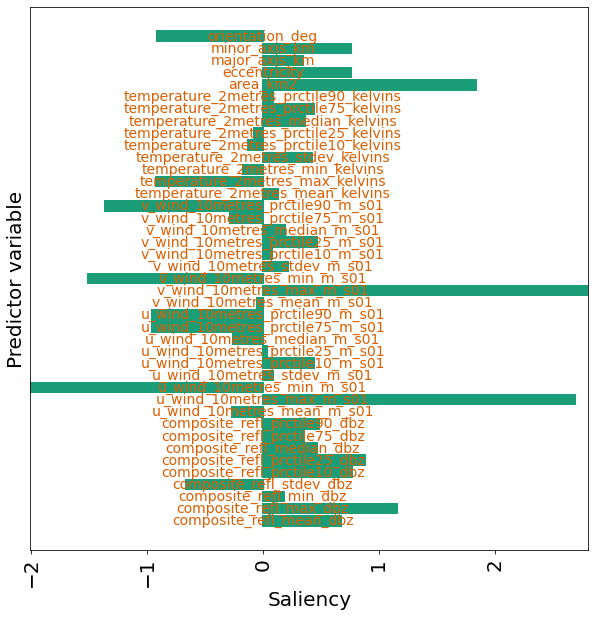

In [ ]:
utils.plot_saliency(
    saliency_values=numpy.mean(saliency_matrix, axis=0),
    predictor_names=list(tabular_testing_predictor_table)
)

pyplot.show()

## Input times gradient

 - The next cell computes and plots mean input * gradient * sign(input) for each predictor.
 - This info tells us the mean contribution of each predictor to the model's predictions.
 - **For more on how to interpret input * gradient * sign(input), see beginning of Lecture 4 (slides or recording).**

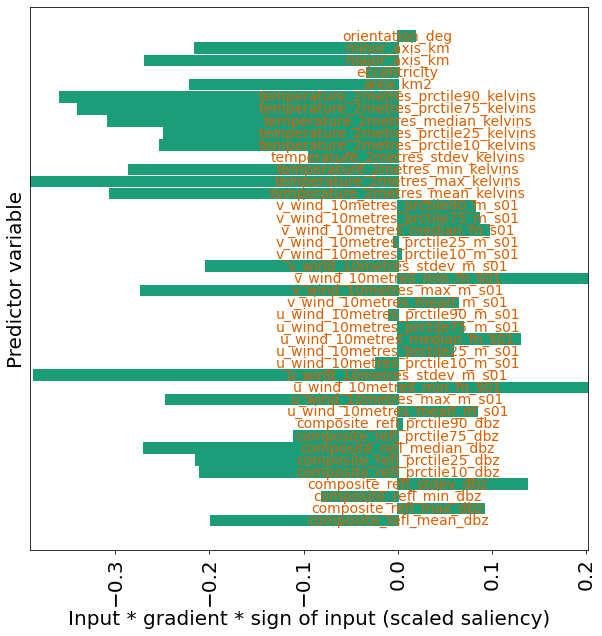

In [ ]:
input_times_grad_matrix = (
    tabular_testing_predictor_table.to_numpy() * saliency_matrix
)

utils.plot_input_times_grad(
    input_times_grad_values=numpy.mean(input_times_grad_matrix, axis=0),
    predictor_names=list(tabular_testing_predictor_table)
)

pyplot.show()

# Saliency maps for CNNs

## Theory

Recall that saliency is defined as follows:
<br>
<center>$s = \frac{\partial a}{\partial x} \bigg \rvert_{x = x_0}$</center>
<br><br>

 - **For both FCNNs and CNNs, there is one saliency value per scalar predictor.**
 - For FCNNs in the Colab notebook, this means one saliency value for each of the 41 tabular predictors.
 - For CNNs in the Colab notebook, this means one saliency for each channel at each grid cell (32 * 32 * 4 = 4096 values).
 - **Thus, for CNNs we can plot the saliency map as a spatial map, on the same grid as the input data.**

## Saliency for random example

The next cell computes and plots the saliency map for a random example in the testing data.  To interpret the plot:

 - Remember that saliency is $\frac{\partial p}{\partial x}$, where $p$ is probability of strong future rotation and $x$ is a predictor.
 - Solid contours mean positive saliency ($p$ increases when $x$ increases).
 - Dashed contours mean positive saliency ($p$ decreases when $x$ increases).
 - Positive $u$-wind is westerly (towards the east/right).
 - Positive $v$-wind is southerly (towards the north/top).

Have computed saliency maps for 0 of 1 examples...
Have computed saliency maps for all 1 examples!


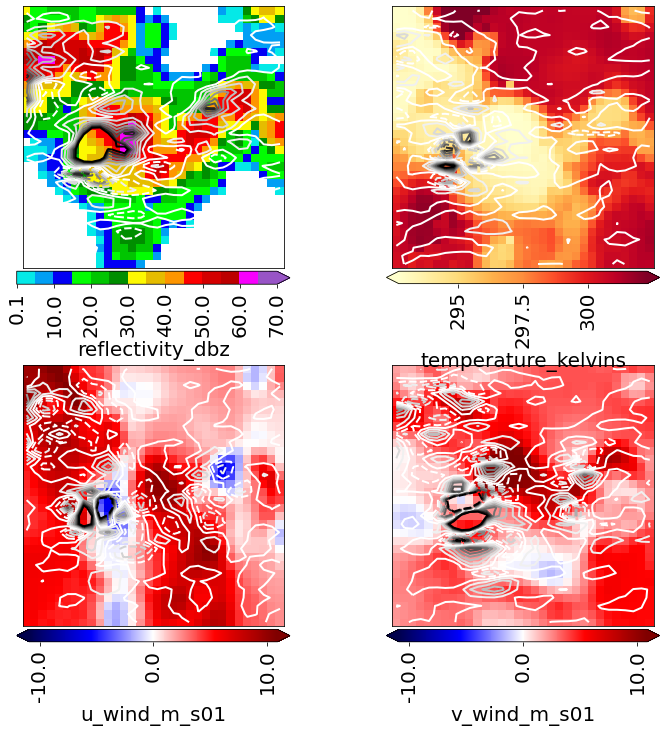

In [ ]:
predictor_matrix_denorm = testing_image_dict[image_utils.PREDICTOR_MATRIX_KEY]
predictor_names = testing_image_dict[image_utils.PREDICTOR_NAMES_KEY]

num_examples = predictor_matrix_denorm.shape[0]
random_index = random.randint(0, num_examples - 1)
# random_index = 14138
predictor_matrix_denorm = predictor_matrix_denorm[random_index, ...]

predictor_matrix_norm, _ = image_normalization.normalize_data(
    predictor_matrix=copy.deepcopy(predictor_matrix_denorm),
    predictor_names=predictor_names, normalization_dict=image_normalization_dict
)

saliency_matrix = utils.get_saliency_one_neuron(
    model_object=cnn_model_object,
    predictor_matrix=numpy.expand_dims(predictor_matrix_norm, axis=0),
    layer_name=cnn_model_object.layers[-1].name,
    neuron_indices=numpy.array([0], dtype=int),
    ideal_activation=1.
)[0, ...]

saliency_matrix = saliency.smooth_saliency_maps(
    saliency_matrices=[saliency_matrix], smoothing_radius_grid_cells=1
)[0]

temperature_matrix_kelvins = predictor_matrix_denorm[
    ..., predictor_names.index(image_utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(image_utils.U_WIND_NAME),
    predictor_names.index(image_utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(predictor_matrix_denorm[..., wind_indices]), 99
)

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=predictor_matrix_denorm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01
    )
)

max_saliency = numpy.percentile(numpy.absolute(saliency_matrix), 99)

saliency.plot_saliency_maps(
    saliency_matrix_3d=saliency_matrix,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=max_saliency,
    contour_interval=max_saliency / 8
)

### Input times gradient

The next cell computes and plots input * gradient * sign(input) for the same random example.  <font color='red'>You must run the above cell (for the saliency map) before running this one.</font>
<br><br>
To interpret the plot:

 - Remember that gradient = saliency = $\frac{\partial p}{\partial x}$, where $p$ is probability of strong future rotation and $x$ is a predictor.
 - Solid contours mean positive input * gradient * sign(input), so $x$ contributes positively to $p$.
 - Dashed contours mean negative input * gradient * sign(input), so $x$ contributes negatively to $p$.
 - **For more on how to interpret input * gradient * sign(input), see beginning of Lecture 4 (slides or recording).**

Have computed saliency maps for 0 of 1 examples...
Have computed saliency maps for all 1 examples!


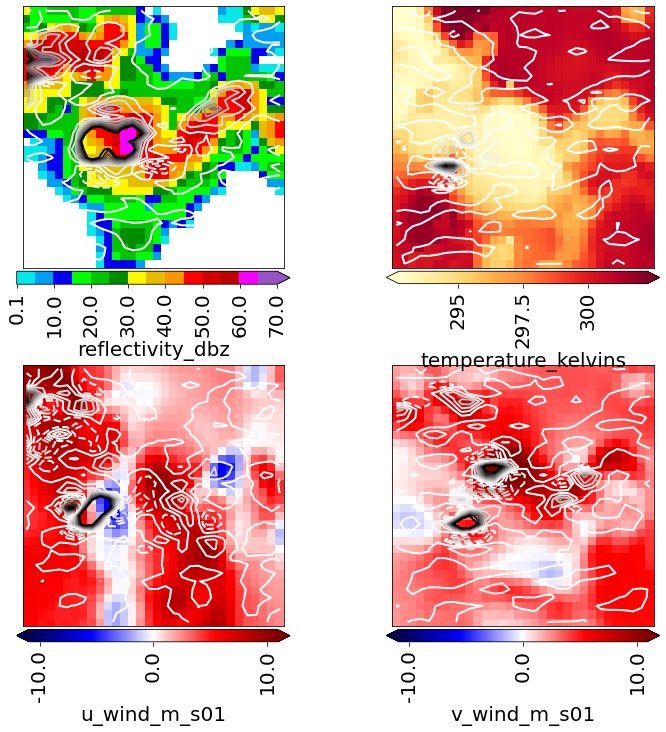

In [ ]:
saliency_matrix = utils.get_saliency_one_neuron(
    model_object=cnn_model_object,
    predictor_matrix=numpy.expand_dims(predictor_matrix_norm, axis=0),
    layer_name=cnn_model_object.layers[-1].name,
    neuron_indices=numpy.array([0], dtype=int),
    ideal_activation=1.
)[0, ...]

input_times_grad_matrix = predictor_matrix_norm * saliency_matrix
input_times_grad_matrix = saliency.smooth_saliency_maps(
    saliency_matrices=[input_times_grad_matrix], smoothing_radius_grid_cells=1
)[0]

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=predictor_matrix_denorm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01
    )
)

max_colour_value = numpy.percentile(numpy.absolute(input_times_grad_matrix), 99)

saliency.plot_saliency_maps(
    saliency_matrix_3d=input_times_grad_matrix,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=max_colour_value,
    contour_interval=max_colour_value / 8
)

## Saliency for strong example

The next cell computes and plots the saliency map for the strongest example in the testing data (that with the greatest max future vorticity).

Have computed saliency maps for 0 of 1 examples...
Have computed saliency maps for all 1 examples!


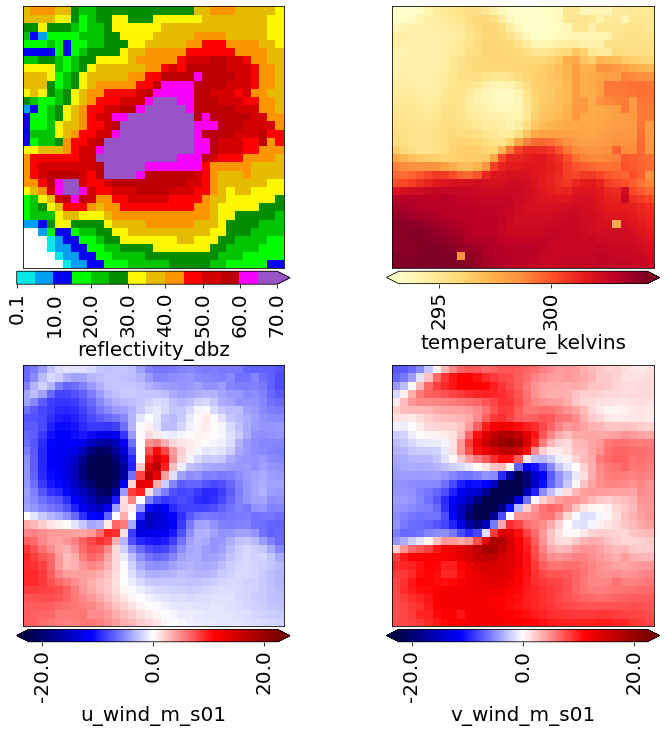

In [ ]:
target_matrix_s01 = testing_image_dict[image_utils.TARGET_MATRIX_KEY]
example_index = numpy.unravel_index(
    numpy.argmax(target_matrix_s01), target_matrix_s01.shape
)[0]

predictor_matrix_denorm = (
    testing_image_dict[image_utils.PREDICTOR_MATRIX_KEY][example_index, ...]
)
predictor_names = testing_image_dict[image_utils.PREDICTOR_NAMES_KEY]

predictor_matrix_norm, _ = image_normalization.normalize_data(
    predictor_matrix=copy.deepcopy(predictor_matrix_denorm),
    predictor_names=predictor_names, normalization_dict=image_normalization_dict
)

saliency_matrix = utils.get_saliency_one_neuron(
    model_object=cnn_model_object,
    predictor_matrix=numpy.expand_dims(predictor_matrix_norm, axis=0),
    layer_name=cnn_model_object.layers[-1].name,
    neuron_indices=numpy.array([0], dtype=int),
    ideal_activation=1.
)[0, ...]

saliency_matrix = saliency.smooth_saliency_maps(
    saliency_matrices=[saliency_matrix], smoothing_radius_grid_cells=1
)[0]

temperature_matrix_kelvins = predictor_matrix_denorm[
    ..., predictor_names.index(image_utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(image_utils.U_WIND_NAME),
    predictor_names.index(image_utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(predictor_matrix_denorm[..., wind_indices]), 99
)

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=predictor_matrix_denorm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01
    )
)

max_saliency = numpy.percentile(numpy.absolute(saliency_matrix), 99)

saliency.plot_saliency_maps(
    saliency_matrix_3d=saliency_matrix,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=max_saliency,
    contour_interval=max_saliency / 8
)

### Input times gradient

The next cell computes and plots input * gradient * sign(input) for the same example (the strongest).  <font color='red'>You must run the above cell (for the saliency map) before running this one.</font>

Have computed saliency maps for 0 of 1 examples...
Have computed saliency maps for all 1 examples!


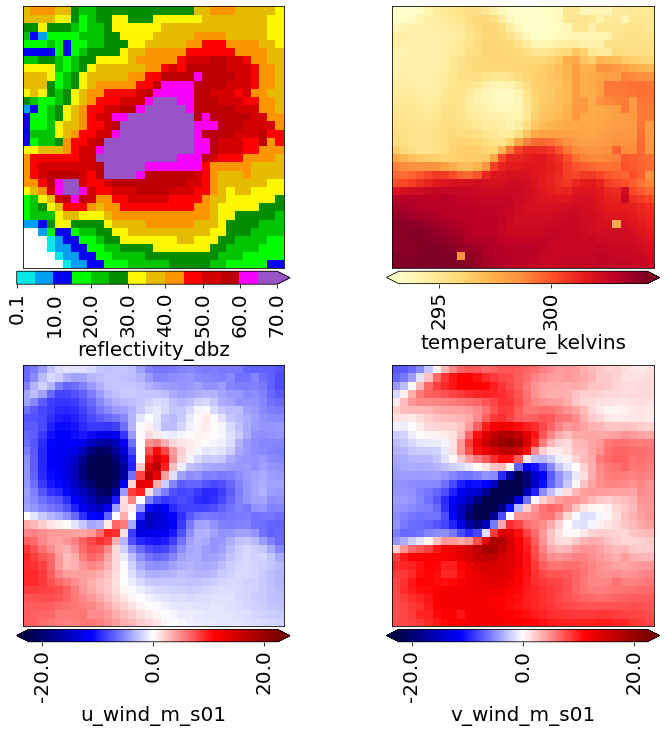

In [ ]:
saliency_matrix = utils.get_saliency_one_neuron(
    model_object=cnn_model_object,
    predictor_matrix=numpy.expand_dims(predictor_matrix_norm, axis=0),
    layer_name=cnn_model_object.layers[-1].name,
    neuron_indices=numpy.array([0], dtype=int),
    ideal_activation=1.
)[0, ...]

input_times_grad_matrix = (
    predictor_matrix_norm * saliency_matrix
)
input_times_grad_matrix = saliency.smooth_saliency_maps(
    saliency_matrices=[input_times_grad_matrix], smoothing_radius_grid_cells=1
)[0]

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=predictor_matrix_denorm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01
    )
)

max_colour_value = numpy.percentile(numpy.absolute(input_times_grad_matrix), 99)

saliency.plot_saliency_maps(
    saliency_matrix_3d=input_times_grad_matrix,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=max_colour_value,
    contour_interval=max_colour_value / 8
)

## Saliency for extreme cases

The next two cells compute, then plot, the composite (PMM) saliency map for each set of extreme cases.

In [ ]:
best_hits_saliency_matrix = utils.get_saliency_one_neuron(
    model_object=cnn_model_object,
    predictor_matrix=extreme_example_dict_norm[BEST_HIT_MATRIX_KEY],
    layer_name=cnn_model_object.layers[-1].name,
    neuron_indices=numpy.array([0], dtype=int),
    ideal_activation=1.
)
best_hits_saliency_matrix = utils.run_pmm_many_variables(
    field_matrix=best_hits_saliency_matrix
)
best_hits_saliency_matrix = saliency.smooth_saliency_maps(
    saliency_matrices=[best_hits_saliency_matrix],
    smoothing_radius_grid_cells=1
)[0]

worst_false_alarms_saliency_matrix = utils.get_saliency_one_neuron(
    model_object=cnn_model_object,
    predictor_matrix=extreme_example_dict_norm[WORST_FALSE_ALARM_MATRIX_KEY],
    layer_name=cnn_model_object.layers[-1].name,
    neuron_indices=numpy.array([0], dtype=int),
    ideal_activation=1.
)
worst_false_alarms_saliency_matrix = utils.run_pmm_many_variables(
    field_matrix=worst_false_alarms_saliency_matrix
)
worst_false_alarms_saliency_matrix = saliency.smooth_saliency_maps(
    saliency_matrices=[worst_false_alarms_saliency_matrix],
    smoothing_radius_grid_cells=1
)[0]

worst_misses_saliency_matrix = utils.get_saliency_one_neuron(
    model_object=cnn_model_object,
    predictor_matrix=extreme_example_dict_norm[WORST_MISS_MATRIX_KEY],
    layer_name=cnn_model_object.layers[-1].name,
    neuron_indices=numpy.array([0], dtype=int),
    ideal_activation=1.
)
worst_misses_saliency_matrix = utils.run_pmm_many_variables(
    field_matrix=worst_misses_saliency_matrix
)
worst_misses_saliency_matrix = saliency.smooth_saliency_maps(
    saliency_matrices=[worst_misses_saliency_matrix],
    smoothing_radius_grid_cells=1
)[0]

best_correct_nulls_saliency_matrix = utils.get_saliency_one_neuron(
    model_object=cnn_model_object,
    predictor_matrix=extreme_example_dict_norm[BEST_CORRECT_NULLS_MATRIX_KEY],
    layer_name=cnn_model_object.layers[-1].name,
    neuron_indices=numpy.array([0], dtype=int),
    ideal_activation=1.
)
best_correct_nulls_saliency_matrix = utils.run_pmm_many_variables(
    field_matrix=best_correct_nulls_saliency_matrix
)
best_correct_nulls_saliency_matrix = saliency.smooth_saliency_maps(
    saliency_matrices=[best_correct_nulls_saliency_matrix],
    smoothing_radius_grid_cells=1
)[0]

Have computed saliency maps for 0 of 100 examples...
Have computed saliency maps for all 100 examples!
Have computed saliency maps for 0 of 100 examples...
Have computed saliency maps for all 100 examples!
Have computed saliency maps for 0 of 100 examples...
Have computed saliency maps for all 100 examples!
Have computed saliency maps for 0 of 100 examples...
Have computed saliency maps for all 100 examples!


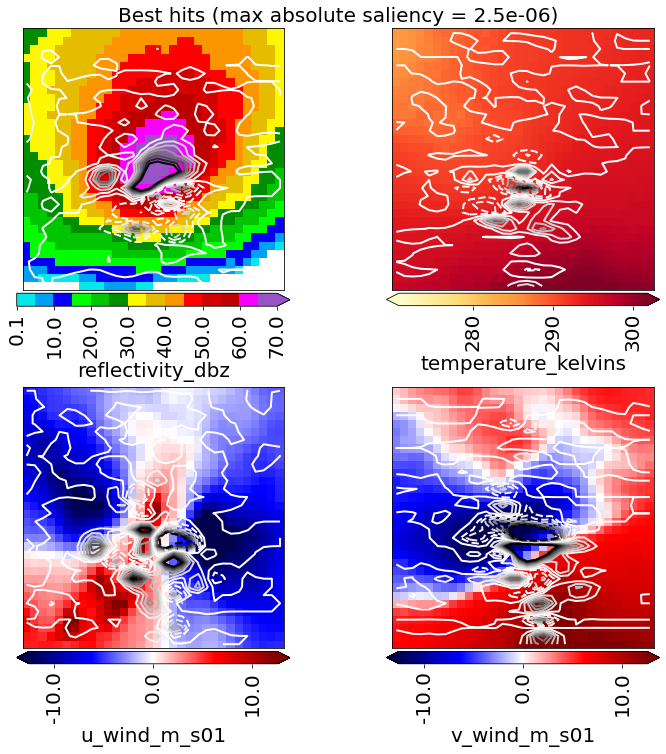

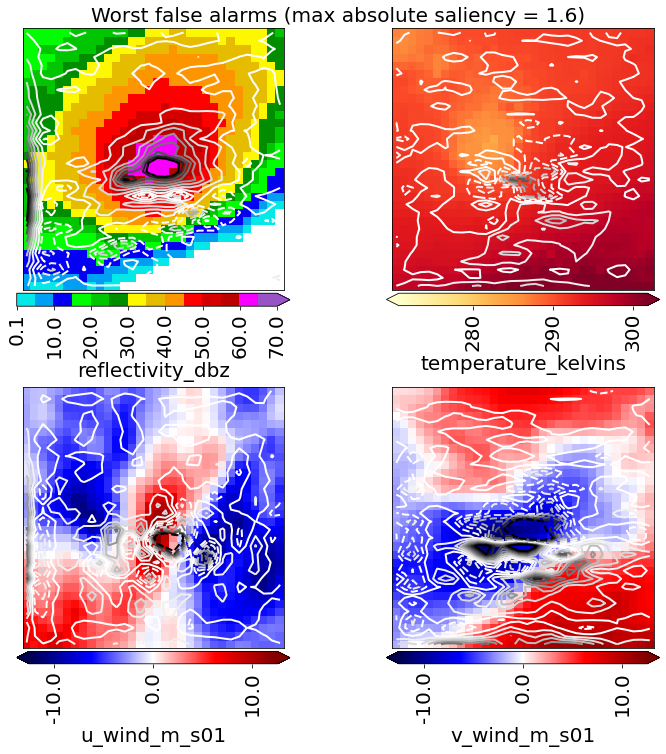

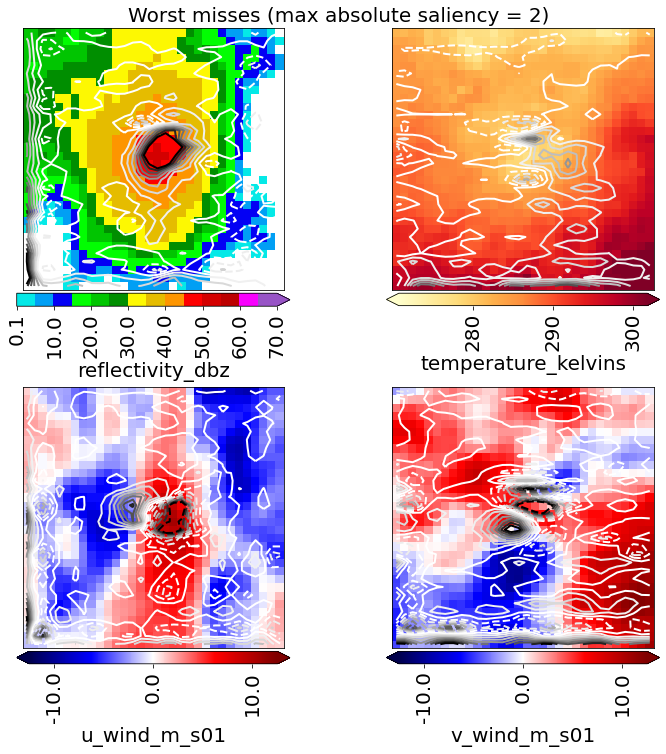

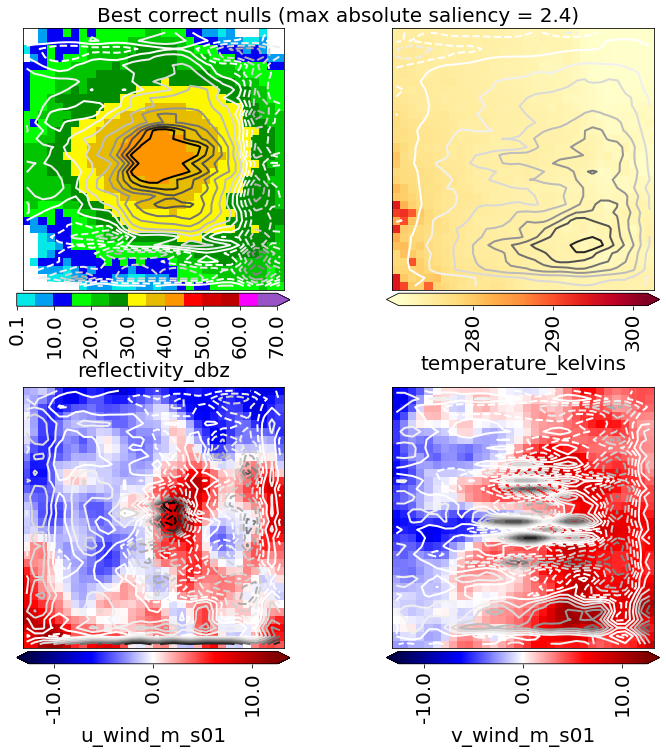

In [ ]:
predictor_names = extreme_example_dict_denorm_pmm[PREDICTOR_NAMES_KEY]

concat_predictor_matrix = numpy.stack((
    extreme_example_dict_denorm_pmm[BEST_HIT_MATRIX_KEY],
    extreme_example_dict_denorm_pmm[WORST_FALSE_ALARM_MATRIX_KEY],
    extreme_example_dict_denorm_pmm[WORST_MISS_MATRIX_KEY],
    extreme_example_dict_denorm_pmm[BEST_CORRECT_NULLS_MATRIX_KEY]
), axis=0)

temperature_matrix_kelvins = concat_predictor_matrix[
    ..., predictor_names.index(image_utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(image_utils.U_WIND_NAME),
    predictor_names.index(image_utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(concat_predictor_matrix[..., wind_indices]), 99
)

this_max_saliency = numpy.percentile(
    numpy.absolute(best_hits_saliency_matrix), 99
)

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=extreme_example_dict_denorm_pmm[BEST_HIT_MATRIX_KEY],
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01
    )
)

saliency.plot_saliency_maps(
    saliency_matrix_3d=best_hits_saliency_matrix,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=this_max_saliency,
    contour_interval=this_max_saliency / 8
)

figure_object.suptitle(
    'Best hits (max absolute saliency = {0:.2g})'.format(this_max_saliency)
)
pyplot.show()
print('\n\n')

this_max_saliency = numpy.percentile(
    numpy.absolute(worst_false_alarms_saliency_matrix), 99
)

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=
        extreme_example_dict_denorm_pmm[WORST_FALSE_ALARM_MATRIX_KEY],
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01
    )
)

saliency.plot_saliency_maps(
    saliency_matrix_3d=worst_false_alarms_saliency_matrix,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=this_max_saliency,
    contour_interval=this_max_saliency / 8
)

figure_object.suptitle(
    'Worst false alarms (max absolute saliency = {0:.2g})'.format(
        this_max_saliency
    )
)
pyplot.show()
print('\n\n')

this_max_saliency = numpy.percentile(
    numpy.absolute(worst_misses_saliency_matrix), 99
)

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=
        extreme_example_dict_denorm_pmm[WORST_MISS_MATRIX_KEY],
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01
    )
)

saliency.plot_saliency_maps(
    saliency_matrix_3d=worst_misses_saliency_matrix,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=this_max_saliency,
    contour_interval=this_max_saliency / 8
)

figure_object.suptitle(
    'Worst misses (max absolute saliency = {0:.2g})'.format(this_max_saliency)
)
pyplot.show()
print('\n\n')

this_max_saliency = numpy.percentile(
    numpy.absolute(best_correct_nulls_saliency_matrix), 99
)

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=
        extreme_example_dict_denorm_pmm[BEST_CORRECT_NULLS_MATRIX_KEY],
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01
    )
)

saliency.plot_saliency_maps(
    saliency_matrix_3d=best_correct_nulls_saliency_matrix,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=this_max_saliency,
    contour_interval=this_max_saliency / 8
)

figure_object.suptitle(
    'Best correct nulls (max absolute saliency = {0:.2g})'.format(
        this_max_saliency
    )
)
pyplot.show()

### Input times gradient

The next two cells compute, then plot, the composite (PMM) map of input * gradient * sign(input) for each set of extreme cases.

In [ ]:
best_hits_saliency_matrix = utils.get_saliency_one_neuron(
    model_object=cnn_model_object,
    predictor_matrix=extreme_example_dict_norm[BEST_HIT_MATRIX_KEY],
    layer_name=cnn_model_object.layers[-1].name,
    neuron_indices=numpy.array([0], dtype=int),
    ideal_activation=1.
)
best_hits_input_times_grad_matrix = (
    best_hits_saliency_matrix *
    extreme_example_dict_norm[BEST_HIT_MATRIX_KEY]
)
best_hits_input_times_grad_matrix = utils.run_pmm_many_variables(
    field_matrix=best_hits_input_times_grad_matrix
)
best_hits_input_times_grad_matrix = saliency.smooth_saliency_maps(
    saliency_matrices=[best_hits_input_times_grad_matrix],
    smoothing_radius_grid_cells=1
)[0]

worst_false_alarms_saliency_matrix = utils.get_saliency_one_neuron(
    model_object=cnn_model_object,
    predictor_matrix=extreme_example_dict_norm[WORST_FALSE_ALARM_MATRIX_KEY],
    layer_name=cnn_model_object.layers[-1].name,
    neuron_indices=numpy.array([0], dtype=int),
    ideal_activation=1.
)
wfa_input_times_grad_matrix = (
    worst_false_alarms_saliency_matrix *
    extreme_example_dict_norm[WORST_FALSE_ALARM_MATRIX_KEY]
)
wfa_input_times_grad_matrix = utils.run_pmm_many_variables(
    field_matrix=wfa_input_times_grad_matrix
)
wfa_input_times_grad_matrix = saliency.smooth_saliency_maps(
    saliency_matrices=[wfa_input_times_grad_matrix],
    smoothing_radius_grid_cells=1
)[0]

worst_misses_saliency_matrix = utils.get_saliency_one_neuron(
    model_object=cnn_model_object,
    predictor_matrix=extreme_example_dict_norm[WORST_MISS_MATRIX_KEY],
    layer_name=cnn_model_object.layers[-1].name,
    neuron_indices=numpy.array([0], dtype=int),
    ideal_activation=1.
)
worst_misses_input_times_grad_matrix = (
    worst_misses_saliency_matrix *
    extreme_example_dict_norm[WORST_MISS_MATRIX_KEY]
)
worst_misses_input_times_grad_matrix = utils.run_pmm_many_variables(
    field_matrix=worst_misses_input_times_grad_matrix
)
worst_misses_input_times_grad_matrix = saliency.smooth_saliency_maps(
    saliency_matrices=[worst_misses_input_times_grad_matrix],
    smoothing_radius_grid_cells=1
)[0]

best_correct_nulls_saliency_matrix = utils.get_saliency_one_neuron(
    model_object=cnn_model_object,
    predictor_matrix=extreme_example_dict_norm[BEST_CORRECT_NULLS_MATRIX_KEY],
    layer_name=cnn_model_object.layers[-1].name,
    neuron_indices=numpy.array([0], dtype=int),
    ideal_activation=1.
)
bcn_input_times_grad_matrix = (
    best_correct_nulls_saliency_matrix *
    extreme_example_dict_norm[BEST_CORRECT_NULLS_MATRIX_KEY]
)
bcn_input_times_grad_matrix = utils.run_pmm_many_variables(
    field_matrix=bcn_input_times_grad_matrix
)
bcn_input_times_grad_matrix = saliency.smooth_saliency_maps(
    saliency_matrices=[bcn_input_times_grad_matrix],
    smoothing_radius_grid_cells=1
)[0]

Have computed saliency maps for 0 of 100 examples...
Have computed saliency maps for all 100 examples!
Have computed saliency maps for 0 of 100 examples...
Have computed saliency maps for all 100 examples!
Have computed saliency maps for 0 of 100 examples...
Have computed saliency maps for all 100 examples!
Have computed saliency maps for 0 of 100 examples...
Have computed saliency maps for all 100 examples!


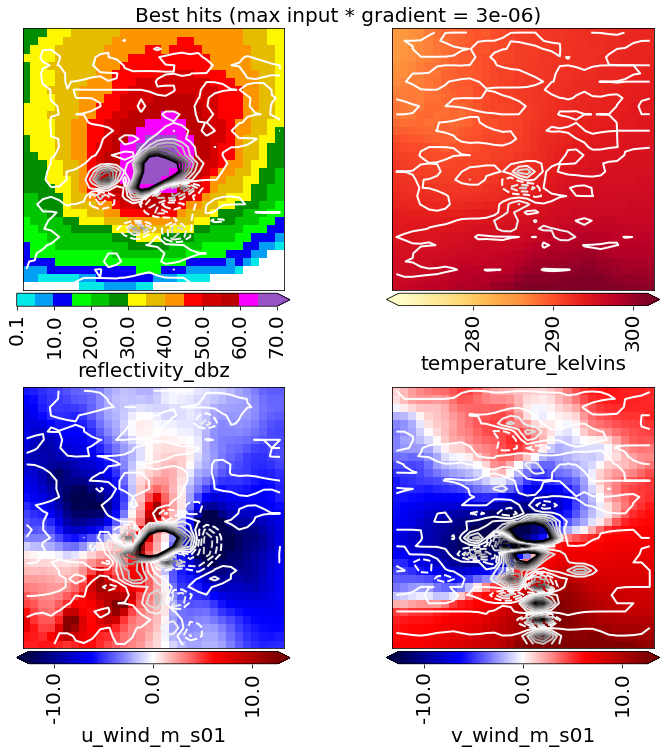

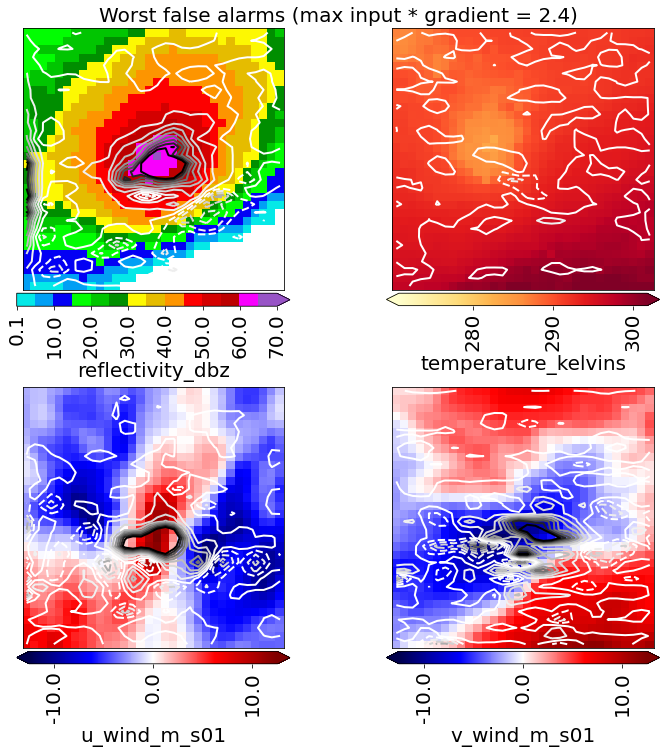

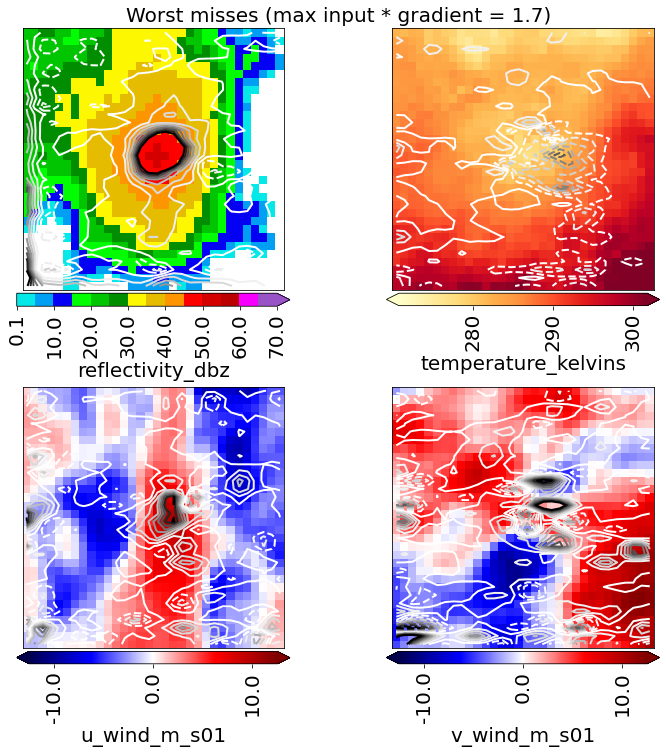

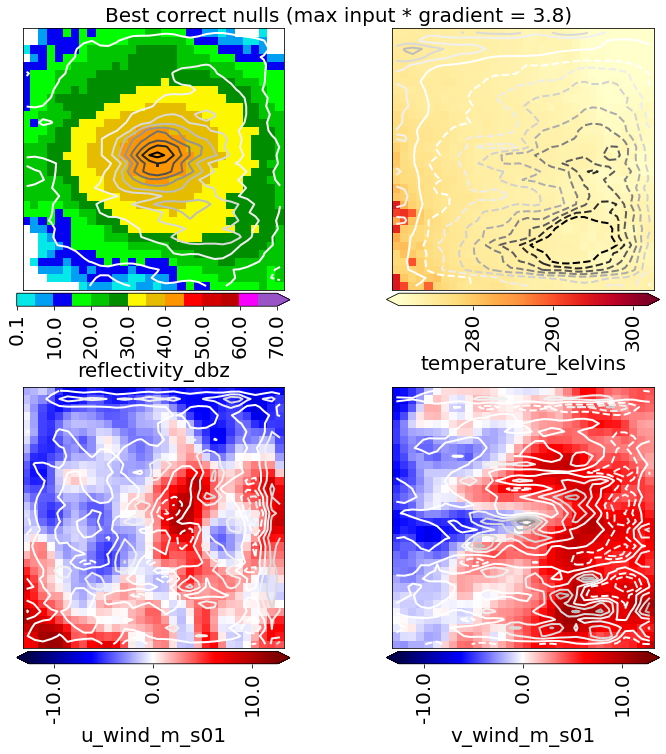

In [ ]:
predictor_names = extreme_example_dict_denorm_pmm[PREDICTOR_NAMES_KEY]

concat_predictor_matrix = numpy.stack((
    extreme_example_dict_denorm_pmm[BEST_HIT_MATRIX_KEY],
    extreme_example_dict_denorm_pmm[WORST_FALSE_ALARM_MATRIX_KEY],
    extreme_example_dict_denorm_pmm[WORST_MISS_MATRIX_KEY],
    extreme_example_dict_denorm_pmm[BEST_CORRECT_NULLS_MATRIX_KEY]
), axis=0)

temperature_matrix_kelvins = concat_predictor_matrix[
    ..., predictor_names.index(image_utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(image_utils.U_WIND_NAME),
    predictor_names.index(image_utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(concat_predictor_matrix[..., wind_indices]), 99
)

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=extreme_example_dict_denorm_pmm[BEST_HIT_MATRIX_KEY],
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01
    )
)

max_input_times_grad = numpy.percentile(
    numpy.absolute(best_hits_input_times_grad_matrix), 99
)
saliency.plot_saliency_maps(
    saliency_matrix_3d=best_hits_input_times_grad_matrix,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=max_input_times_grad,
    contour_interval=max_input_times_grad / 8
)

figure_object.suptitle(
    'Best hits (max input * gradient = {0:.2g})'.format(
        max_input_times_grad
    )
)
pyplot.show()
print('\n\n')

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=
        extreme_example_dict_denorm_pmm[WORST_FALSE_ALARM_MATRIX_KEY],
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01
    )
)

max_input_times_grad = numpy.percentile(
    numpy.absolute(wfa_input_times_grad_matrix), 99
)
saliency.plot_saliency_maps(
    saliency_matrix_3d=wfa_input_times_grad_matrix,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=max_input_times_grad,
    contour_interval=max_input_times_grad / 8
)

figure_object.suptitle(
    'Worst false alarms (max input * gradient = {0:.2g})'.format(
        max_input_times_grad
    )
)
pyplot.show()
print('\n\n')

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=
        extreme_example_dict_denorm_pmm[WORST_MISS_MATRIX_KEY],
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01
    )
)

max_input_times_grad = numpy.percentile(
    numpy.absolute(worst_misses_input_times_grad_matrix), 99
)
saliency.plot_saliency_maps(
    saliency_matrix_3d=worst_misses_input_times_grad_matrix,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=max_input_times_grad,
    contour_interval=max_input_times_grad / 8
)

figure_object.suptitle(
    'Worst misses (max input * gradient = {0:.2g})'.format(
        max_input_times_grad
    )
)
pyplot.show()
print('\n\n')

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=
        extreme_example_dict_denorm_pmm[BEST_CORRECT_NULLS_MATRIX_KEY],
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01
    )
)

max_input_times_grad = numpy.percentile(
    numpy.absolute(bcn_input_times_grad_matrix), 99
)
saliency.plot_saliency_maps(
    saliency_matrix_3d=bcn_input_times_grad_matrix,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=max_input_times_grad,
    contour_interval=max_input_times_grad / 8
)

figure_object.suptitle(
    'Best correct nulls (max input * gradient = {0:.2g})'.format(
        max_input_times_grad
    )
)
pyplot.show()

# Class-activation maps (CAM)

## Theory (high-level)

 - **Class activation is the amount of evidence for a particular class, defined at each grid point.**
 - In this notebook we consider only the positive class (strong future rotation).
 - However, we could also compute class activation for the negative class.
<br><br>

**Conceptually, are four key differences between CAMs and saliency maps:**

 1. CAMs yield one value per grid point, whereas saliency maps yield one value per scalar predictor.
 2. CAMs yield only non-negative values (in this context there is no such thing as negative evidence), whereas saliency can be positive or negative.
 3. CAMs highlight the most important values for generating the model's actual prediction, whereas saliency maps highlight the most important values for changing the prediction.
 4. CAMs are specific to a single convolutional layer, while saliency maps are not.
    - CAMs produced by deeper layers are smoother, with large values confined to a smaller region.
    - This is because deeper layers learn higher-level abstractions, which allows them to focus more selectively on important parts of the image.

## Theory (nitty-gritty)

 - The original CAM method (Zhou *et al.* 2016) works only for a specific type of CNN architecture, so we use a generalized version called gradient-weighted CAM (Grad-CAM; Selvaraju *et al.* 2017).
 - The original CAM method requires the CNN to end with a global-average-pooling layer, whereas Grad-CAM allows for a wider variety of architectures, including those ending with dense layers.
<br><br>

Under Grad-CAM, class activation is defined separately for each data example, at each convolutional layer $\mathcal{L}$, at each grid point $(i, j)$ in the feature maps output by $\mathcal{L}$.  Specifically:
<center>$E_{ij, k} = \textrm{max}(\sum\limits_{c = 1}^{C} \alpha_k^c A_{ij}^{c}, 0)$</center>
<center>$\textrm{where }\alpha_k^c = \frac{1}{MN} \sum\limits_{i = 1}^{M} \sum\limits_{j = 1}^{N} \frac{\partial \tilde{p}_k}{\partial A_{ij}^{c}}$</center>
<br><br>

 - $A_{ij}^{c}$ is the value for channel $c$ at grid point $(i, j)$ of the feature map output by layer $\mathcal{L}$.
 - $\tilde{p}_k$ is the psuedo-probability (before the activation function, which here is sigmoid) of class $k$.
 - $M$ and $N$ are the number of spatial rows and columns, respectively, in the feature map output by layer $\mathcal{L}$.
 - $C$ is the number of channels in the feature map output by layer $\mathcal{L}$.
 - $E_{ij, k}$ is the class activation (or evidence) for class $k$ at grid point $(i, j)$.
<br><br>

 - By applying the above equations to every grid point for a given convolutional layer and data example (iterating over $i$ and $j$), one can create a class-activation *map* (CAM).
 - These maps are usually overlain on the input data (predictors).
 - However, the spatial dimensions of the feature map output by layer $\mathcal{L}$ may not match the spatial dimensions of the input, due to pooling layers in between.
 - Thus, before plotting the CAM, it is common practice to upsample the CAM to the dimensions of the input data.
 - In this notebook we use cubic interpolation to do this upsampling.

## (Dis)advantages

**Advantages:**
 - Provide example-specific explanations
 - For spatial input, can show results as spatial map (human-intuitive)
 - Flags most important values for actual prediction, not for changing prediction
   - Saliency and input * gradient do the latter, so CAMs complement saliency or input * gradient well
 - Can compute saliency for any conv layer
   - However, the choice of conv layer is an extra parameter
<br><br>

**Disadvantages:**
 - Only for CNNs
 - Example-specific, so a lot of data to look at
   - However, you can composite over many examples

## CAM for random example

The next cell computes and plots the CAM for a random example in the testing data.  To interpret the plot:

 - Remember that class activation = amount of evidence for the positive class (strong future rotation).
 - Darker contours mean higher class activation.
 - Absence of contours means zero class activation.
 - The same CAM is overlain on all predictor variables.

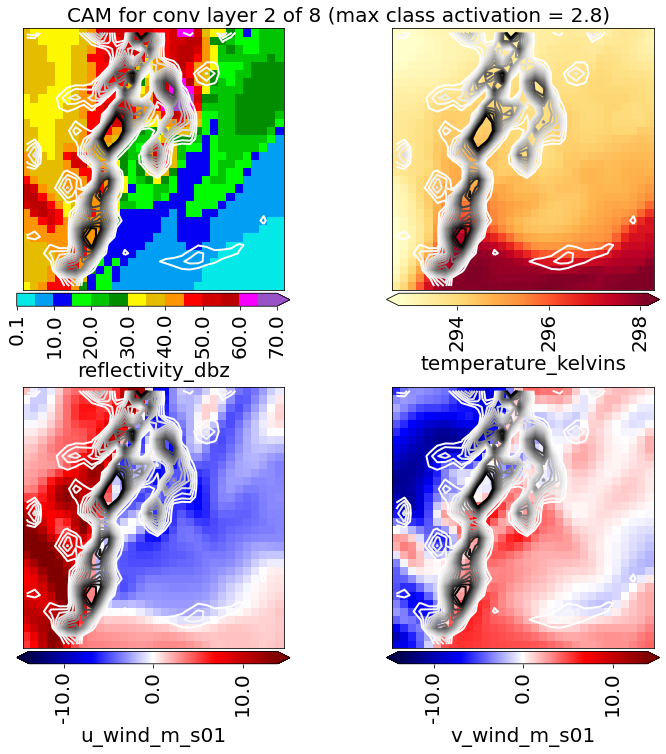

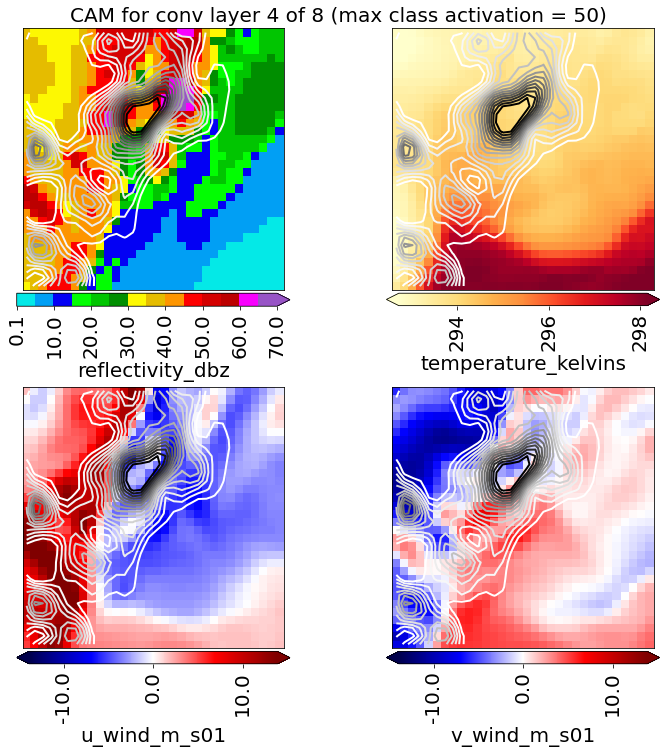

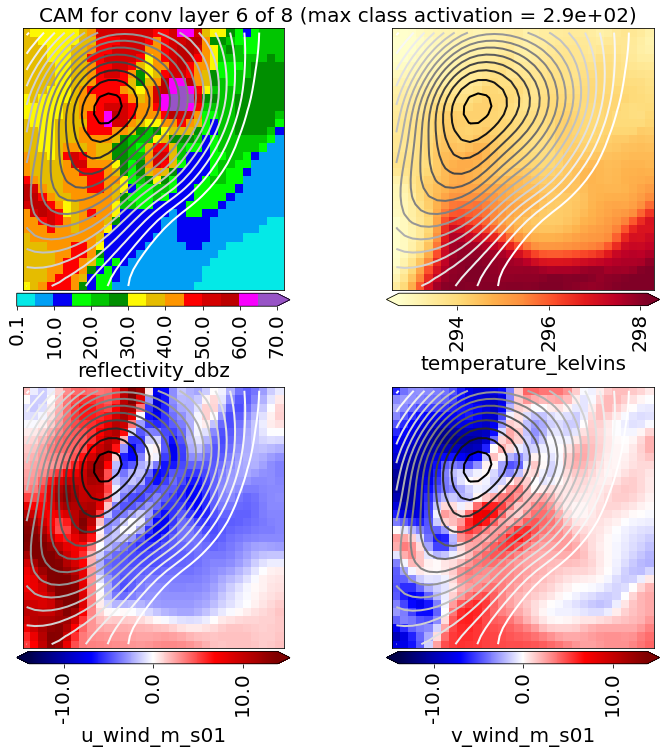

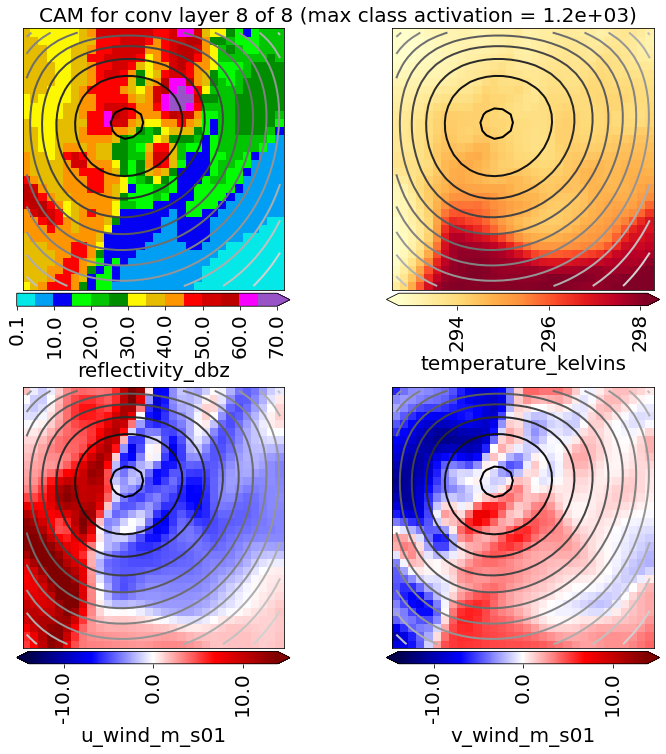

In [ ]:
predictor_matrix_denorm = testing_image_dict[image_utils.PREDICTOR_MATRIX_KEY]
predictor_names = testing_image_dict[image_utils.PREDICTOR_NAMES_KEY]

num_examples = predictor_matrix_denorm.shape[0]
random_index = random.randint(0, num_examples - 1)
predictor_matrix_denorm = predictor_matrix_denorm[random_index, ...]

predictor_matrix_norm, _ = image_normalization.normalize_data(
    predictor_matrix=copy.deepcopy(predictor_matrix_denorm),
    predictor_names=predictor_names, normalization_dict=image_normalization_dict
)

temperature_matrix_kelvins = predictor_matrix_denorm[
    ..., predictor_names.index(image_utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(image_utils.U_WIND_NAME),
    predictor_names.index(image_utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(predictor_matrix_denorm[..., wind_indices]), 99
)

conv_layer_names = [
    'batch_normalization_1', 'batch_normalization_3',
    'batch_normalization_5', 'batch_normalization_7'
]
conv_layer_indices = numpy.array([2, 4, 6, 8], dtype=int)

for i in range(len(conv_layer_names)):
    class_activation_matrix = class_activation.run_gradcam(
        model_object=cnn_model_object, input_matrix=predictor_matrix_norm,
        target_class=1, target_layer_name=conv_layer_names[i]
    )

    figure_object, axes_object_matrix = (
        image_plotting.plot_many_predictors_sans_barbs(
            predictor_matrix=predictor_matrix_denorm,
            predictor_names=predictor_names,
            min_colour_temp_kelvins=min_temp_kelvins,
            max_colour_temp_kelvins=max_temp_kelvins,
            max_colour_wind_speed_m_s01=max_speed_m_s01)
    )

    max_activation = numpy.percentile(class_activation_matrix, 99)

    class_activation.plot_2d_cam(
        class_activation_matrix_2d=class_activation_matrix,
        axes_object_matrix=axes_object_matrix,
        num_channels=predictor_matrix_norm.shape[-1],
        colour_map_object=pyplot.get_cmap('Greys'),
        min_contour_value=max_activation / 15,
        max_contour_value=max_activation,
        contour_interval=max_activation / 15
    )

    figure_object.suptitle(
        'CAM for conv layer {0:d} of 8 (max class activation = {1:.2g})'.format(
            conv_layer_indices[i], max_activation
        )
    )
    pyplot.show()

    if i != len(conv_layer_names) - 1:
        print('\n\n')

## CAM for strong example

The next cell computes and plots the CAM for the strongest example in the testing data (that with the greatest max future vorticity).

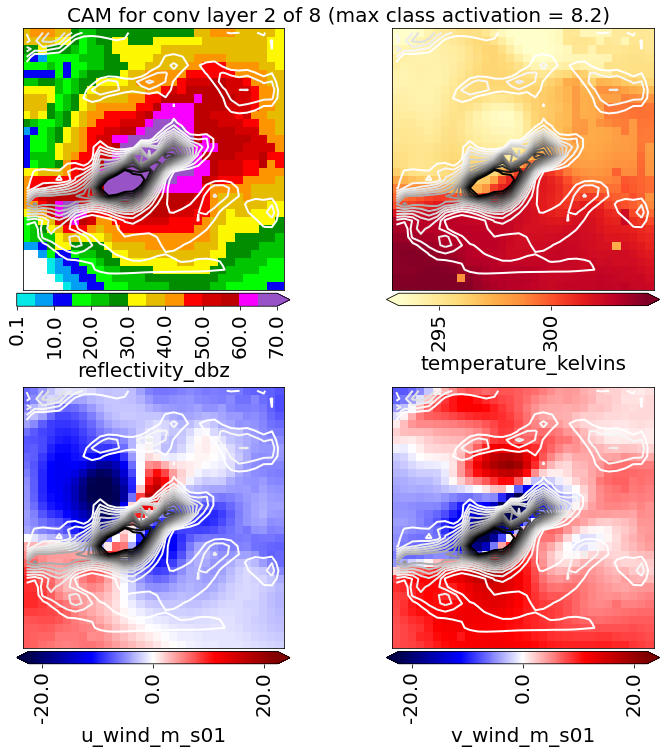

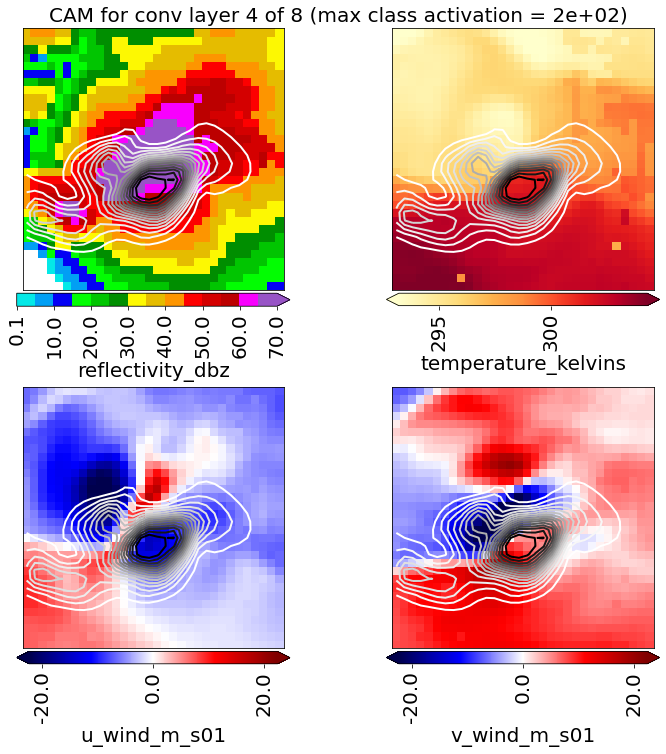

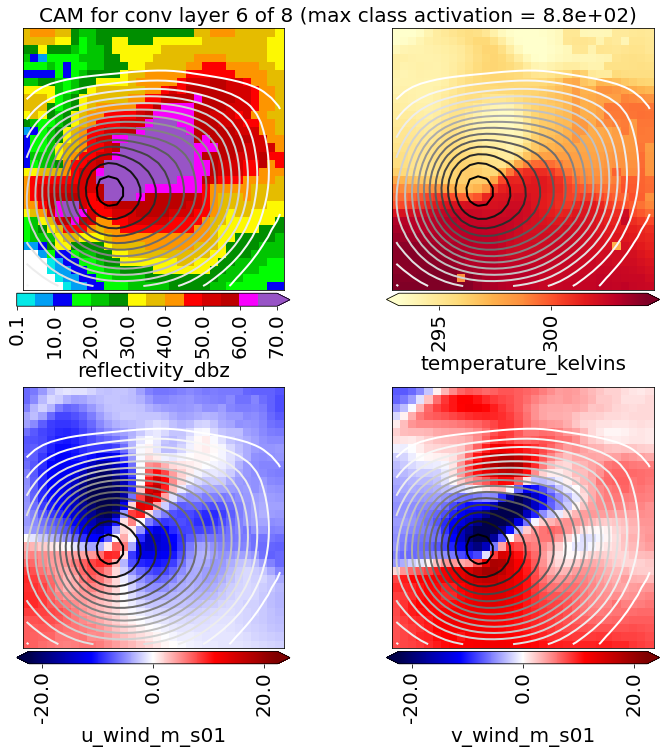

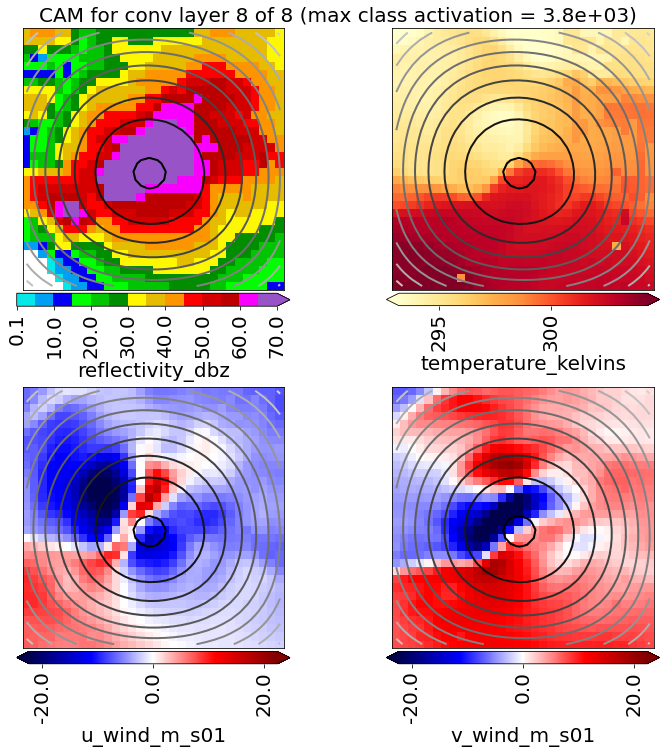

In [ ]:
target_matrix_s01 = testing_image_dict[image_utils.TARGET_MATRIX_KEY]
example_index = numpy.unravel_index(
    numpy.argmax(target_matrix_s01), target_matrix_s01.shape
)[0]

predictor_matrix_denorm = (
    testing_image_dict[image_utils.PREDICTOR_MATRIX_KEY][example_index, ...]
)
predictor_names = testing_image_dict[image_utils.PREDICTOR_NAMES_KEY]

predictor_matrix_norm, _ = image_normalization.normalize_data(
    predictor_matrix=copy.deepcopy(predictor_matrix_denorm),
    predictor_names=predictor_names, normalization_dict=image_normalization_dict
)

temperature_matrix_kelvins = predictor_matrix_denorm[
    ..., predictor_names.index(image_utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(image_utils.U_WIND_NAME),
    predictor_names.index(image_utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(predictor_matrix_denorm[..., wind_indices]), 99
)

conv_layer_names = [
    'batch_normalization_1', 'batch_normalization_3',
    'batch_normalization_5', 'batch_normalization_7'
]
conv_layer_indices = numpy.array([2, 4, 6, 8], dtype=int)

for i in range(len(conv_layer_names)):
    class_activation_matrix = class_activation.run_gradcam(
        model_object=cnn_model_object, input_matrix=predictor_matrix_norm,
        target_class=1, target_layer_name=conv_layer_names[i]
    )

    figure_object, axes_object_matrix = (
        image_plotting.plot_many_predictors_sans_barbs(
            predictor_matrix=predictor_matrix_denorm,
            predictor_names=predictor_names,
            min_colour_temp_kelvins=min_temp_kelvins,
            max_colour_temp_kelvins=max_temp_kelvins,
            max_colour_wind_speed_m_s01=max_speed_m_s01)
    )

    max_activation = numpy.percentile(class_activation_matrix, 99)

    class_activation.plot_2d_cam(
        class_activation_matrix_2d=class_activation_matrix,
        axes_object_matrix=axes_object_matrix,
        num_channels=predictor_matrix_norm.shape[-1],
        colour_map_object=pyplot.get_cmap('Greys'),
        min_contour_value=max_activation / 15,
        max_contour_value=max_activation,
        contour_interval=max_activation / 15
    )

    figure_object.suptitle(
        'CAM for conv layer {0:d} of 8 (max class activation = {1:.2g})'.format(
            conv_layer_indices[i], max_activation
        )
    )
    pyplot.show()

    if i != len(conv_layer_names) - 1:
        print('\n\n')

## CAM for extreme cases

The next two cells compute, then plot, the composite (PMM) class-activation map for each set of extreme cases.

In [ ]:
num_examples_per_set = extreme_example_dict_norm[BEST_HIT_MATRIX_KEY].shape[0]

dimensions = extreme_example_dict_norm[BEST_HIT_MATRIX_KEY].shape[:-1]
best_hits_cam_matrix = numpy.full(dimensions, numpy.nan)
worst_false_alarms_cam_matrix = numpy.full(dimensions, numpy.nan)
worst_misses_cam_matrix = numpy.full(dimensions, numpy.nan)
best_correct_nulls_cam_matrix = numpy.full(dimensions, numpy.nan)

conv_layer_name = 'batch_normalization_3'
conv_layer_index = 3

for i in range(num_examples_per_set):
    print('Have computed CAM for {0:d} of {1:d} extreme examples...'.format(
        4 * i, 4 * num_examples_per_set
    ))

    best_hits_cam_matrix[i, ...] = class_activation.run_gradcam(
        model_object=cnn_model_object,
        input_matrix=extreme_example_dict_norm[BEST_HIT_MATRIX_KEY][i, ...],
        target_class=1, target_layer_name=conv_layer_name
    )

    worst_false_alarms_cam_matrix[i, ...] = class_activation.run_gradcam(
        model_object=cnn_model_object,
        input_matrix=
        extreme_example_dict_norm[WORST_FALSE_ALARM_MATRIX_KEY][i, ...],
        target_class=1, target_layer_name=conv_layer_name
    )

    worst_misses_cam_matrix[i, ...] = class_activation.run_gradcam(
        model_object=cnn_model_object,
        input_matrix=
        extreme_example_dict_norm[WORST_MISS_MATRIX_KEY][i, ...],
        target_class=1, target_layer_name=conv_layer_name
    )

    best_correct_nulls_cam_matrix[i, ...] = class_activation.run_gradcam(
        model_object=cnn_model_object,
        input_matrix=
        extreme_example_dict_norm[BEST_CORRECT_NULLS_MATRIX_KEY][i, ...],
        target_class=1, target_layer_name=conv_layer_name
    )

print('Have computed CAM for all {0:d} extreme examples!'.format(
    4 * num_examples_per_set
))

best_hits_cam_matrix = utils.run_pmm_one_variable(
    field_matrix=best_hits_cam_matrix
)
worst_false_alarms_cam_matrix = utils.run_pmm_one_variable(
    field_matrix=worst_false_alarms_cam_matrix
)
worst_misses_cam_matrix = utils.run_pmm_one_variable(
    field_matrix=worst_misses_cam_matrix
)
best_correct_nulls_cam_matrix = utils.run_pmm_one_variable(
    field_matrix=best_correct_nulls_cam_matrix
)

Have computed CAM for 0 of 400 extreme examples...
Have computed CAM for 4 of 400 extreme examples...
Have computed CAM for 8 of 400 extreme examples...
Have computed CAM for 12 of 400 extreme examples...
Have computed CAM for 16 of 400 extreme examples...
Have computed CAM for 20 of 400 extreme examples...
Have computed CAM for 24 of 400 extreme examples...
Have computed CAM for 28 of 400 extreme examples...
Have computed CAM for 32 of 400 extreme examples...
Have computed CAM for 36 of 400 extreme examples...
Have computed CAM for 40 of 400 extreme examples...
Have computed CAM for 44 of 400 extreme examples...
Have computed CAM for 48 of 400 extreme examples...
Have computed CAM for 52 of 400 extreme examples...
Have computed CAM for 56 of 400 extreme examples...
Have computed CAM for 60 of 400 extreme examples...
Have computed CAM for 64 of 400 extreme examples...
Have computed CAM for 68 of 400 extreme examples...


KeyboardInterrupt: ignored

In [ ]:
predictor_names = extreme_example_dict_denorm_pmm[PREDICTOR_NAMES_KEY]

concat_predictor_matrix = numpy.stack((
    extreme_example_dict_denorm_pmm[BEST_HIT_MATRIX_KEY],
    extreme_example_dict_denorm_pmm[WORST_FALSE_ALARM_MATRIX_KEY],
    extreme_example_dict_denorm_pmm[WORST_MISS_MATRIX_KEY],
    extreme_example_dict_denorm_pmm[BEST_CORRECT_NULLS_MATRIX_KEY]
), axis=0)

temperature_matrix_kelvins = concat_predictor_matrix[
    ..., predictor_names.index(image_utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(image_utils.U_WIND_NAME),
    predictor_names.index(image_utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(concat_predictor_matrix[..., wind_indices]), 99
)

this_max_activation = numpy.percentile(best_hits_cam_matrix, 99)

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=extreme_example_dict_denorm_pmm[BEST_HIT_MATRIX_KEY],
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01
    )
)

class_activation.plot_2d_cam(
    class_activation_matrix_2d=best_hits_cam_matrix,
    axes_object_matrix=axes_object_matrix,
    num_channels=len(predictor_names),
    colour_map_object=pyplot.get_cmap('Greys'),
    min_contour_value=this_max_activation / 15,
    max_contour_value=this_max_activation,
    contour_interval=this_max_activation / 15
)

figure_object.suptitle(
    'Best hits (max class activation = {0:.2g})'.format(this_max_activation)
)
pyplot.show()
print('\n\n')

this_max_activation = numpy.percentile(worst_false_alarms_cam_matrix, 99)

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=
        extreme_example_dict_denorm_pmm[WORST_FALSE_ALARM_MATRIX_KEY],
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01
    )
)

class_activation.plot_2d_cam(
    class_activation_matrix_2d=worst_false_alarms_cam_matrix,
    axes_object_matrix=axes_object_matrix,
    num_channels=len(predictor_names),
    colour_map_object=pyplot.get_cmap('Greys'),
    min_contour_value=this_max_activation / 15,
    max_contour_value=this_max_activation,
    contour_interval=this_max_activation / 15
)

figure_object.suptitle(
    'Worst false alarms (max class activation = {0:.2g})'.format(
        this_max_activation
    )
)
pyplot.show()
print('\n\n')

this_max_activation = numpy.percentile(worst_misses_cam_matrix, 99)

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=extreme_example_dict_denorm_pmm[WORST_MISS_MATRIX_KEY],
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01
    )
)

class_activation.plot_2d_cam(
    class_activation_matrix_2d=worst_misses_cam_matrix,
    axes_object_matrix=axes_object_matrix,
    num_channels=len(predictor_names),
    colour_map_object=pyplot.get_cmap('Greys'),
    min_contour_value=this_max_activation / 15,
    max_contour_value=this_max_activation,
    contour_interval=this_max_activation / 15
)

figure_object.suptitle(
    'Worst misses (max class activation = {0:.2g})'.format(this_max_activation)
)
pyplot.show()
print('\n\n')

this_max_activation = numpy.percentile(best_correct_nulls_cam_matrix, 99)

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=
        extreme_example_dict_denorm_pmm[BEST_CORRECT_NULLS_MATRIX_KEY],
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01
    )
)

class_activation.plot_2d_cam(
    class_activation_matrix_2d=best_correct_nulls_cam_matrix,
    axes_object_matrix=axes_object_matrix,
    num_channels=len(predictor_names),
    colour_map_object=pyplot.get_cmap('Greys'),
    min_contour_value=this_max_activation / 15,
    max_contour_value=this_max_activation,
    contour_interval=this_max_activation / 15
)

figure_object.suptitle(
    'Best correct nulls (max class activation = {0:.2g})'.format(
        this_max_activation
    )
)
pyplot.show()

# Occlusion maps

## Theory

Write stuff here.

## Occlusion for random example

Write stuff here.

Occluding window centered on row 0, column 0...
Occluding window centered on row 0, column 1...
Occluding window centered on row 0, column 2...
Occluding window centered on row 0, column 3...
Occluding window centered on row 0, column 4...
Occluding window centered on row 0, column 5...
Occluding window centered on row 0, column 6...
Occluding window centered on row 0, column 7...
Occluding window centered on row 0, column 8...
Occluding window centered on row 0, column 9...
Occluding window centered on row 0, column 10...
Occluding window centered on row 0, column 11...
Occluding window centered on row 0, column 12...
Occluding window centered on row 0, column 13...
Occluding window centered on row 0, column 14...
Occluding window centered on row 0, column 15...
Occluding window centered on row 0, column 16...
Occluding window centered on row 0, column 17...
Occluding window centered on row 0, column 18...
Occluding window centered on row 0, column 19...
Occluding window centered on r

Text(0.5, 0.98, 'Original probability = 0.0379 ... max normalized prob change in map = 0.58')

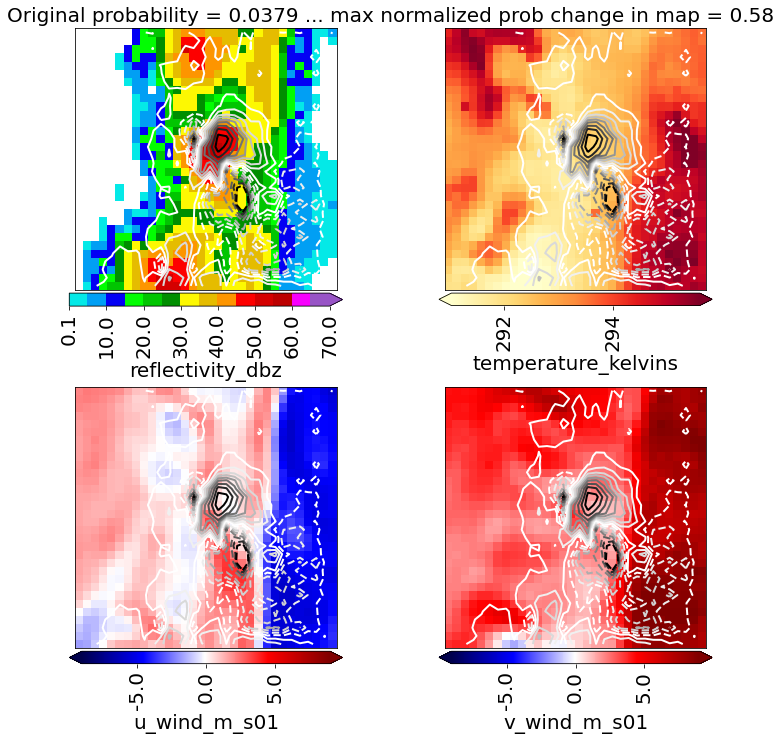

In [ ]:
predictor_matrix_denorm = testing_image_dict[image_utils.PREDICTOR_MATRIX_KEY]
predictor_names = testing_image_dict[image_utils.PREDICTOR_NAMES_KEY]

num_examples = predictor_matrix_denorm.shape[0]
random_index = random.randint(0, num_examples - 1)
# random_index = 14138
predictor_matrix_denorm = predictor_matrix_denorm[random_index, ...]

predictor_matrix_norm, _ = image_normalization.normalize_data(
    predictor_matrix=copy.deepcopy(predictor_matrix_denorm),
    predictor_names=predictor_names, normalization_dict=image_normalization_dict
)

occlusion_prob_matrix, original_probs = occlusion.get_occlusion_maps(
    model_object=cnn_model_object,
    predictor_matrix=numpy.expand_dims(predictor_matrix_norm, axis=0),
    half_window_size_px=1, fill_value=0.
)
normalized_occlusion_matrix = occlusion.normalize_occlusion_maps(
    occlusion_prob_matrix=occlusion_prob_matrix, original_probs=original_probs
)
# normalized_occlusion_matrix = saliency.smooth_saliency_maps(
#     occlusion_prob_matrix=normalized_occlusion_matrix,
#     smoothing_radius_grid_cells=1
# )

normalized_occlusion_matrix = normalized_occlusion_matrix[0, ...]
original_prob = original_probs[0]

temperature_matrix_kelvins = predictor_matrix_denorm[
    ..., predictor_names.index(image_utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(image_utils.U_WIND_NAME),
    predictor_names.index(image_utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(predictor_matrix_denorm[..., wind_indices]), 99
)

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=predictor_matrix_denorm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01
    )
)

max_contour_value = numpy.percentile(
    normalized_occlusion_matrix[normalized_occlusion_matrix >= 0], 99
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        occlusion.plot_normalized_occlusion_map(
            normalized_occlusion_matrix_2d=normalized_occlusion_matrix,
            axes_object=axes_object_matrix[i, j],
            colour_map_object=pyplot.get_cmap('Greys'),
            max_contour_value=max_contour_value,
            contour_interval=max_contour_value / 8
        )

title_string = (
    'Original probability = {0:.4f} ... max normalized prob change in map '
    '= {1:.2g}'
).format(original_prob, max_contour_value)

figure_object.suptitle(title_string)

## Occlusion for strong example

Write stuff here.

Occluding window centered on row 0, column 0...
Occluding window centered on row 0, column 1...
Occluding window centered on row 0, column 2...
Occluding window centered on row 0, column 3...
Occluding window centered on row 0, column 4...
Occluding window centered on row 0, column 5...
Occluding window centered on row 0, column 6...
Occluding window centered on row 0, column 7...
Occluding window centered on row 0, column 8...
Occluding window centered on row 0, column 9...
Occluding window centered on row 0, column 10...
Occluding window centered on row 0, column 11...
Occluding window centered on row 0, column 12...
Occluding window centered on row 0, column 13...
Occluding window centered on row 0, column 14...
Occluding window centered on row 0, column 15...
Occluding window centered on row 0, column 16...
Occluding window centered on row 0, column 17...
Occluding window centered on row 0, column 18...
Occluding window centered on row 0, column 19...
Occluding window centered on r

Text(0.5, 0.98, 'Original probability = 1.0000 ... max normalized prob change in map = 3.6e-07')

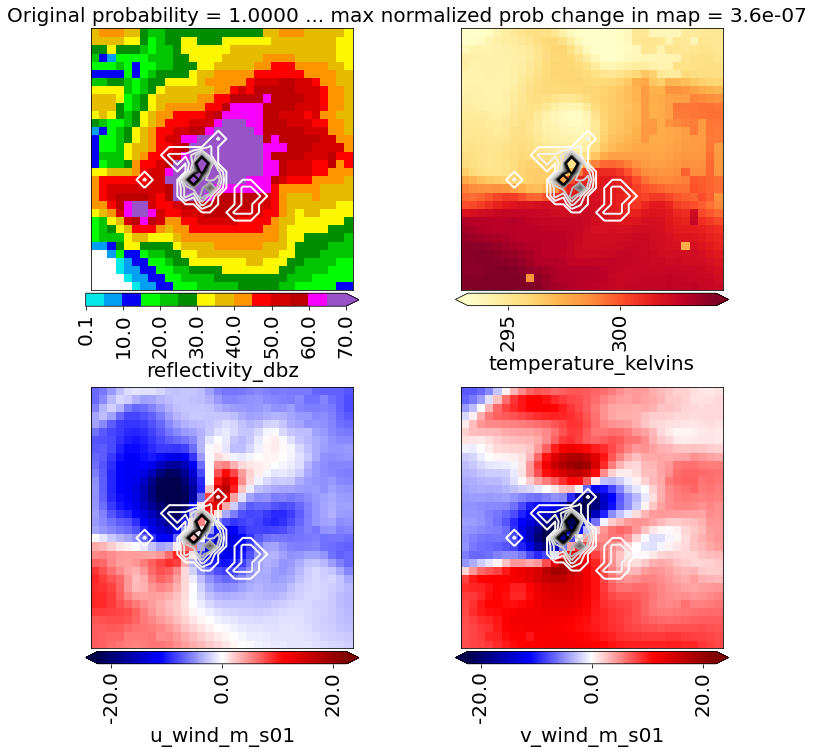

In [ ]:
target_matrix_s01 = testing_image_dict[image_utils.TARGET_MATRIX_KEY]
example_index = numpy.unravel_index(
    numpy.argmax(target_matrix_s01), target_matrix_s01.shape
)[0]

predictor_matrix_denorm = (
    testing_image_dict[image_utils.PREDICTOR_MATRIX_KEY][example_index, ...]
)
predictor_names = testing_image_dict[image_utils.PREDICTOR_NAMES_KEY]

predictor_matrix_norm, _ = image_normalization.normalize_data(
    predictor_matrix=copy.deepcopy(predictor_matrix_denorm),
    predictor_names=predictor_names, normalization_dict=image_normalization_dict
)

occlusion_prob_matrix, original_probs = occlusion.get_occlusion_maps(
    model_object=cnn_model_object,
    predictor_matrix=numpy.expand_dims(predictor_matrix_norm, axis=0),
    half_window_size_px=1, fill_value=0.
)
normalized_occlusion_matrix = occlusion.normalize_occlusion_maps(
    occlusion_prob_matrix=occlusion_prob_matrix, original_probs=original_probs
)
# normalized_occlusion_matrix = saliency.smooth_saliency_maps(
#     occlusion_prob_matrix=normalized_occlusion_matrix,
#     smoothing_radius_grid_cells=1
# )

normalized_occlusion_matrix = normalized_occlusion_matrix[0, ...]
original_prob = original_probs[0]

temperature_matrix_kelvins = predictor_matrix_denorm[
    ..., predictor_names.index(image_utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(image_utils.U_WIND_NAME),
    predictor_names.index(image_utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(predictor_matrix_denorm[..., wind_indices]), 99
)

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=predictor_matrix_denorm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01
    )
)

max_contour_value = numpy.percentile(
    normalized_occlusion_matrix[normalized_occlusion_matrix >= 0], 99
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        occlusion.plot_normalized_occlusion_map(
            normalized_occlusion_matrix_2d=normalized_occlusion_matrix,
            axes_object=axes_object_matrix[i, j],
            colour_map_object=pyplot.get_cmap('Greys'),
            max_contour_value=max_contour_value,
            contour_interval=max_contour_value / 8
        )

title_string = (
    'Original probability = {0:.4f} ... max normalized prob change in map '
    '= {1:.2g}'
).format(original_prob, max_contour_value)

figure_object.suptitle(title_string)

## Occlusion for extreme examples

Write stuff here.

In [ ]:
bh_occlusion_prob_matrix, bh_original_probs = occlusion.get_occlusion_maps(
    model_object=cnn_model_object,
    predictor_matrix=extreme_example_dict_norm[BEST_HIT_MATRIX_KEY],
    half_window_size_px=1, fill_value=0.
)
bh_norm_occlusion_matrix = occlusion.normalize_occlusion_maps(
    occlusion_prob_matrix=bh_occlusion_prob_matrix,
    original_probs=bh_original_probs
)
bh_mean_original_prob = numpy.mean(bh_original_probs)
bh_norm_occlusion_matrix = utils.run_pmm_many_variables(
    field_matrix=numpy.expand_dims(bh_norm_occlusion_matrix, axis=-1)
)[..., 0]

wfa_occlusion_prob_matrix, wfa_original_probs = occlusion.get_occlusion_maps(
    model_object=cnn_model_object,
    predictor_matrix=extreme_example_dict_norm[WORST_FALSE_ALARM_MATRIX_KEY],
    half_window_size_px=1, fill_value=0.
)
wfa_norm_occlusion_matrix = occlusion.normalize_occlusion_maps(
    occlusion_prob_matrix=wfa_occlusion_prob_matrix,
    original_probs=wfa_original_probs
)
wfa_mean_original_prob = numpy.mean(wfa_original_probs)
wfa_norm_occlusion_matrix = utils.run_pmm_many_variables(
    field_matrix=numpy.expand_dims(wfa_norm_occlusion_matrix, axis=-1)
)[..., 0]

wm_occlusion_prob_matrix, wm_original_probs = occlusion.get_occlusion_maps(
    model_object=cnn_model_object,
    predictor_matrix=extreme_example_dict_norm[WORST_MISS_MATRIX_KEY],
    half_window_size_px=1, fill_value=0.
)
wm_norm_occlusion_matrix = occlusion.normalize_occlusion_maps(
    occlusion_prob_matrix=wm_occlusion_prob_matrix,
    original_probs=wm_original_probs
)
wm_mean_original_prob = numpy.mean(wm_original_probs)
wm_norm_occlusion_matrix = utils.run_pmm_many_variables(
    field_matrix=numpy.expand_dims(wm_norm_occlusion_matrix, axis=-1)
)[..., 0]

bcn_occlusion_prob_matrix, bcn_original_probs = occlusion.get_occlusion_maps(
    model_object=cnn_model_object,
    predictor_matrix=extreme_example_dict_norm[BEST_CORRECT_NULLS_MATRIX_KEY],
    half_window_size_px=1, fill_value=0.
)
bcn_norm_occlusion_matrix = occlusion.normalize_occlusion_maps(
    occlusion_prob_matrix=bcn_occlusion_prob_matrix,
    original_probs=bcn_original_probs
)
bcn_mean_original_prob = numpy.mean(bcn_original_probs)
bcn_norm_occlusion_matrix = utils.run_pmm_many_variables(
    field_matrix=numpy.expand_dims(bcn_norm_occlusion_matrix, axis=-1)
)[..., 0]

Occluding window centered on row 0, column 0...
Occluding window centered on row 0, column 1...
Occluding window centered on row 0, column 2...
Occluding window centered on row 0, column 3...
Occluding window centered on row 0, column 4...
Occluding window centered on row 0, column 5...
Occluding window centered on row 0, column 6...
Occluding window centered on row 0, column 7...
Occluding window centered on row 0, column 8...
Occluding window centered on row 0, column 9...
Occluding window centered on row 0, column 10...
Occluding window centered on row 0, column 11...
Occluding window centered on row 0, column 12...
Occluding window centered on row 0, column 13...
Occluding window centered on row 0, column 14...
Occluding window centered on row 0, column 15...
Occluding window centered on row 0, column 16...
Occluding window centered on row 0, column 17...
Occluding window centered on row 0, column 18...
Occluding window centered on row 0, column 19...
Occluding window centered on r

Text(0.5, 0.98, 'Best correct nulls ... mean original prob = 0.0043 ... max normalized change = 0.0013')

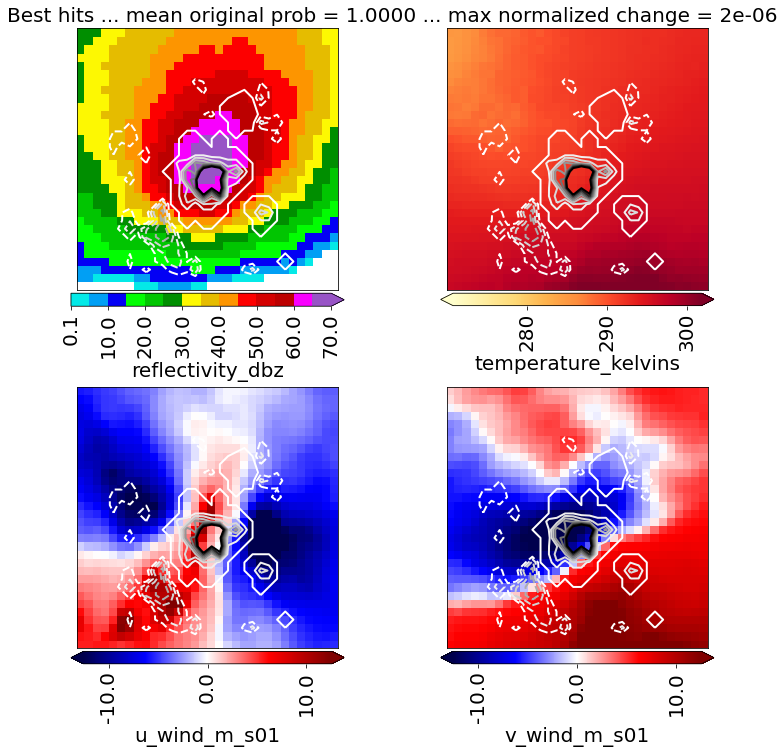

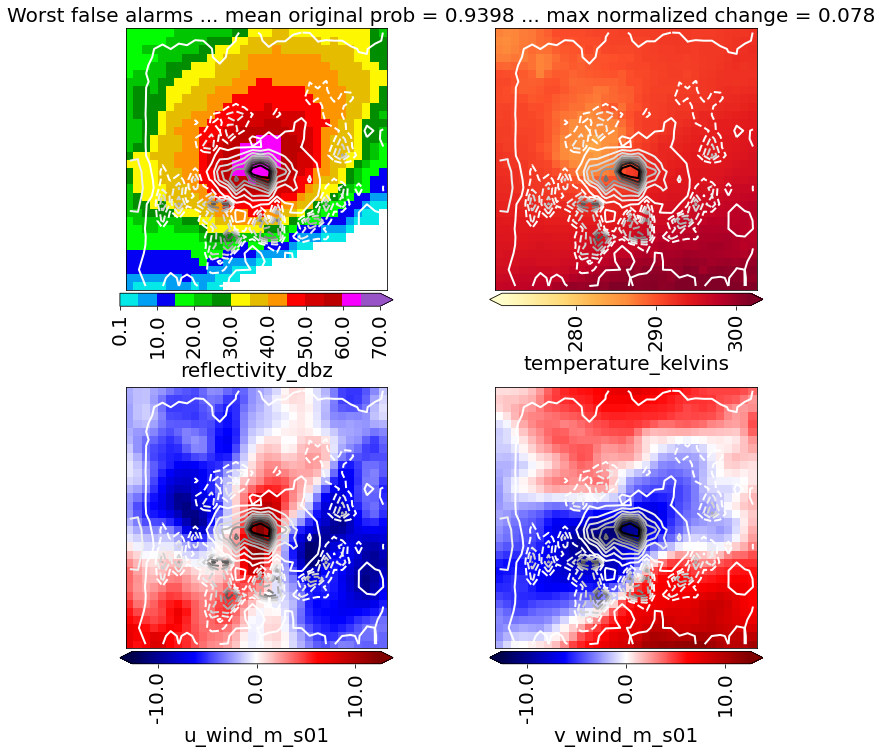

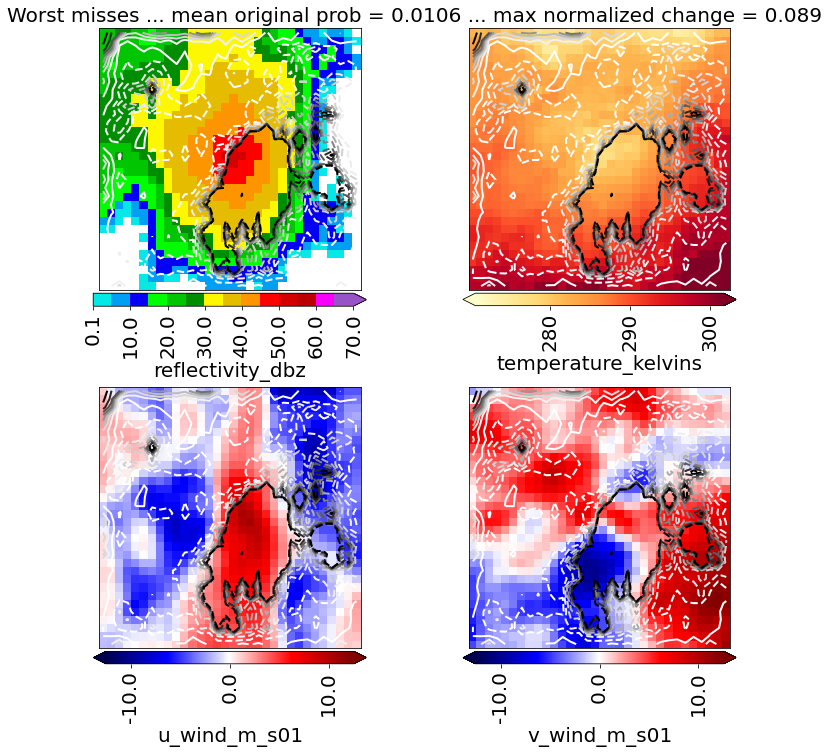

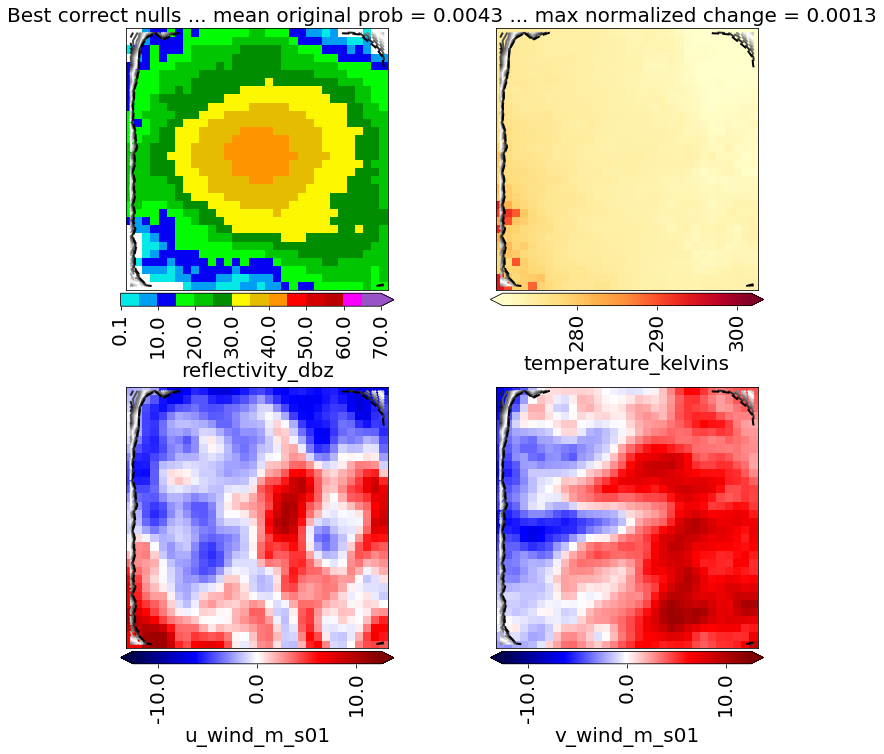

In [ ]:
predictor_names = extreme_example_dict_denorm_pmm[PREDICTOR_NAMES_KEY]

concat_predictor_matrix = numpy.stack((
    extreme_example_dict_denorm_pmm[BEST_HIT_MATRIX_KEY],
    extreme_example_dict_denorm_pmm[WORST_FALSE_ALARM_MATRIX_KEY],
    extreme_example_dict_denorm_pmm[WORST_MISS_MATRIX_KEY],
    extreme_example_dict_denorm_pmm[BEST_CORRECT_NULLS_MATRIX_KEY]
), axis=0)

temperature_matrix_kelvins = concat_predictor_matrix[
    ..., predictor_names.index(image_utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(image_utils.U_WIND_NAME),
    predictor_names.index(image_utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(concat_predictor_matrix[..., wind_indices]), 99
)

this_max_contour_value = numpy.percentile(
    bh_norm_occlusion_matrix[bh_norm_occlusion_matrix >= 0], 99
)

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=extreme_example_dict_denorm_pmm[BEST_HIT_MATRIX_KEY],
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01
    )
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        occlusion.plot_normalized_occlusion_map(
            normalized_occlusion_matrix_2d=bh_norm_occlusion_matrix,
            axes_object=axes_object_matrix[i, j],
            colour_map_object=pyplot.get_cmap('Greys'),
            max_contour_value=this_max_contour_value,
            contour_interval=this_max_contour_value / 8
        )

title_string = (
    'Best hits ... mean original prob = {0:.4f} ... max normalized change '
    '= {1:.2g}'
).format(bh_mean_original_prob, this_max_contour_value)

figure_object.suptitle(title_string)

this_max_contour_value = numpy.percentile(
    wfa_norm_occlusion_matrix[wfa_norm_occlusion_matrix >= 0], 99
)

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=
        extreme_example_dict_denorm_pmm[WORST_FALSE_ALARM_MATRIX_KEY],
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01
    )
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        occlusion.plot_normalized_occlusion_map(
            normalized_occlusion_matrix_2d=wfa_norm_occlusion_matrix,
            axes_object=axes_object_matrix[i, j],
            colour_map_object=pyplot.get_cmap('Greys'),
            max_contour_value=this_max_contour_value,
            contour_interval=this_max_contour_value / 8
        )

title_string = (
    'Worst false alarms ... mean original prob = {0:.4f} ... max normalized '
    'change = {1:.2g}'
).format(wfa_mean_original_prob, this_max_contour_value)

figure_object.suptitle(title_string)

this_max_contour_value = numpy.percentile(
    wm_norm_occlusion_matrix[wm_norm_occlusion_matrix >= 0], 99
)

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=
        extreme_example_dict_denorm_pmm[WORST_MISS_MATRIX_KEY],
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01
    )
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        occlusion.plot_normalized_occlusion_map(
            normalized_occlusion_matrix_2d=wm_norm_occlusion_matrix,
            axes_object=axes_object_matrix[i, j],
            colour_map_object=pyplot.get_cmap('Greys'),
            max_contour_value=this_max_contour_value,
            contour_interval=this_max_contour_value / 8
        )

title_string = (
    'Worst misses ... mean original prob = {0:.4f} ... max normalized '
    'change = {1:.2g}'
).format(wm_mean_original_prob, this_max_contour_value)

figure_object.suptitle(title_string)

this_max_contour_value = numpy.percentile(
    bcn_norm_occlusion_matrix[bcn_norm_occlusion_matrix >= 0], 99
)

figure_object, axes_object_matrix = (
    image_plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=
        extreme_example_dict_denorm_pmm[BEST_CORRECT_NULLS_MATRIX_KEY],
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01
    )
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        occlusion.plot_normalized_occlusion_map(
            normalized_occlusion_matrix_2d=bcn_norm_occlusion_matrix,
            axes_object=axes_object_matrix[i, j],
            colour_map_object=pyplot.get_cmap('Greys'),
            max_contour_value=this_max_contour_value,
            contour_interval=this_max_contour_value / 8
        )

title_string = (
    'Best correct nulls ... mean original prob = {0:.4f} ... max normalized '
    'change = {1:.2g}'
).format(bcn_mean_original_prob, this_max_contour_value)

figure_object.suptitle(title_string)